# Train physics-informed neural network for simple 2D waterflood problem


Xiang Zhai

Aug 20, 2018

***
### Quick Takeaway
-  Compared to 1D case, the neural network has to be significantly more sophisticated in order to capture 2D dynamics
-  More control points need to be sampled near well where complex physics happends. Similar to local refinement in conventional CFD
-  A GPU is prefered.
-  BFGS converges faster than Adam but runs slower. Adam can help at begining of iterations.
-  I **haven't** add geological hetergenarity into the problem yet. So please ignore the spatial dependent K map
-  Manually computing radius to all wells inside neural network helps the neural network converge faster. The solutions look better too.
-  I think the problem will become much more complex for non-uniform problem and for 3D problem.
-  Same code is about 1.5-2 faster on Ubuntu than Windows 10 (same computer!)


## Formulation

- Pressure Equation
$$\nabla\cdot[K(x)\cdot\frac{k_{rw}}{\mu_w}(\gamma S_o^n+S_w^n)\nabla P]=-(Q_o+Q_w)$$
- Saturation Equation
$$\phi\frac{\partial S_w}{\partial t} - \nabla\cdot[K(x)\cdot\frac{k_w}{\mu_w} S_w^n\nabla P] = Q_w$$

where

two-phase: $S_w+S_o=1$

relative permeability: $K_{r\sigma} = K_{\sigma}S_{\sigma}^n$,  $\sigma = o,w$

ratio of rel perm $K_{ro} = \alpha K_{rw}$

ratio of viscosity $\mu_o = \beta \mu_w$

ratio $\gamma = \frac{\alpha}{\beta}$

net source term $Q_\sigma = q_\sigma/\rho_\sigma$


Absorb $k_w/\mu_w$ term into $K(x)$ and we have

$$\nabla\cdot[K(x)(\gamma (1-S_w)^n+S_w^n)\nabla P]=-(Q_o+Q_w)$$

and 

$$\phi\frac{\partial S_w}{\partial t} - \nabla\cdot[K(x)S_w^n\nabla P] = Q_w$$


For 2D case, set

Boundary condition (rate)
- close boundary
$\partial_x P = 0$ at left and right boundaries
$\partial_y P = 0$ at top and right boundaries

Injection at $(0,0)$

Production at $(\pm0.75,\pm0.75)$


Initial condition 
- constant pressure
$P = c$ for all $-1\le x \le 1$
- saturation (all oil)
$S_w = constant$ for all $-1\le x,y \le 1$

Known rates: $Q_{prod}$ and $Q_{inj}$

$Q_w = Q_{inj} + Q_{prod}\times F_w$, $F_w = \frac{u_w}{u_w+u_i}=\frac{s_w^n}{\gamma s_(1-s_w)^n+s_w^n}$
$Q_o = Q_{prod}\times (1-F_w)$

$Q_o+Q_w = Q_{inj}+Q_{prod}$


Let
$$v_x = -K\partial_x P$$

and

$$v_y = -K\partial_y P$$

The equations we need to solve are converted to


$$\partial_x[(\gamma (1-S_w)^n+S_w^n)v_x] + \partial_y[(\gamma (1-S_w)^n+S_w^n)v_y]=Q_o+Q_w$$

and 

$$\phi\frac{\partial S_w}{\partial t} + \partial_x[S_w^nv_x] + \partial_y[S_w^nv_y] = Q_w$$

A third constraint comes from the fact that $(-v_x/K,-v_y/K)=(\partial_xP,\partial_yP)$ is a conservative field (as the gradient of $P$), so that

$$\partial_y v_x - \partial_x v_y = \partial_yK(v_x/K) - \partial_xK(v_y/K)$$

In uniform case, $K$ has no spatial dependence and the equation becomes

$$\partial_y v_x - \partial_x v_y = 0$$



> Note:
  -  I used $v_x$ and $v_y$ in the equations instead of pressure $p$. Becasue I introduced one more variable, I have to add one more equation, which is the curl-free equation.
  -  I didn't do test if this is helpful. My naiive thinking told me that by using $v_x$ and $v_y$, all the derivatives in the equations become first order. In Adam, the gradient will be containing the second derivatives of $v_x$, $v_y$ and $s$, and in BFGS third derivatives will be involved. If we use $p$ instead of $v_x$ and $v_y$, we only need to sovle for two equations, but computing Adam and BFGS will involve computing the derivative of $p$ in third and fourth orders. So I don't really know which approach is easier.
  -  One benifit of using $v_x$ and $v_y$ is that the initial and boundary conditions are easier to impose for closed boundary problem.

In [1]:
#!pip install -q pyDOE

import tensorflow as tf
import numpy as np

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import scipy.io
from scipy.interpolate import griddata
import time
from pyDOE import lhs
import matplotlib.animation

np.random.seed(1234)
tf.set_random_seed(1234)
%matplotlib inline
#%matplotlib notebook


/home/qri/miniconda3/envs/DL/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


### Define physics-informed neural network

In [3]:
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, XYT, U, Indices, layers, WELLs, PermModel, gamma, phi, relpermn):
        #XYT: n by 3 arrays, columns: x, y, t
        #U: n by 1 arrays storing the value of physics quantities to enforce (initial condition, boundary conditions, etc)
        #Indices: storing the indices of U that gives values of vx, vy and sw to match in the training process
        #PermModel: a permeability model
        #WELL: list of wells with location and rate [{x: x coord, y: y coord, Q: rate}, {}, ..] positive rate: injector, negative rate: producer
        
        self.WR = 0.04 #radius of well impacting area
        self.Walpha = 0.5/self.WR/self.WR #1/2sigma^2
    
        self.gamma, self.phi, self.relpermn = gamma, phi, relpermn
        self.WELLs = WELLs

        self.PermModel = PermModel
        
        vxi,vxj, vyi, vyj, swi, swj =   Indices['vx']['begin'], Indices['vx']['end'],\
                                        Indices['vy']['begin'], Indices['vy']['end'],\
                                        Indices['sw']['begin'], Indices['sw']['end']

        self.x = XYT[:,0:1]
        self.y = XYT[:,1:2]
        self.t = XYT[:,2:3]
        self.u = U
        self.dlnk = self.PermModel.getdlnKdxy(XYT[:,0],XYT[:,1]) #get dlnK/dx and dlnK/dy at given locations
        
        self.layers = layers
        self.layers[0] = 3 + len(self.WELLs)
        
        self.lb = XYT.min(axis=0)
        self.ub = XYT.max(axis=0)

        # Initialize NNs
        self.weights, self.biases = self.initialize_NN(layers)

        # tf placeholders and graph
        self.sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True,
                                                     log_device_placement=True))
        
        self.x_tf = tf.placeholder(tf.float32, shape=[None, 1], name='x')
        self.y_tf = tf.placeholder(tf.float32, shape=[None, 1], name='y')
        self.t_tf = tf.placeholder(tf.float32, shape=[None, 1], name='t')
        self.u_tf = tf.placeholder(tf.float32, shape=[None, 1], name='u')
        self.dlnk_tf = tf.placeholder(tf.float32, shape=[None, self.dlnk.shape[1]], name='dlnK')
        
        self.U_pred = \
            self.net_u(self.x_tf, self.y_tf, self.t_tf, self.dlnk_tf)

        self.loss_vx = tf.reduce_mean(tf.square(self.U_pred[vxi:vxj,0:1] - self.u_tf[vxi:vxj,0:1])) #enforce vx
        self.loss_vy = tf.reduce_mean(tf.square(self.U_pred[vyi:vyj,1:2] - self.u_tf[vyi:vyj,0:1])) #enforce vy
        self.loss_sw = tf.reduce_mean(tf.square(self.U_pred[swi:swj,2:3] - self.u_tf[swi:swj,0:1])) #enforce sw
        
        self.loss_fp  = tf.reduce_mean(tf.square(self.U_pred[:,3:4])) #enforce fp
        self.loss_fs  = tf.reduce_mean(tf.square(self.U_pred[:,4:5])) #enforce fs
        self.loss_fv  = tf.reduce_mean(tf.square(self.U_pred[:,5:6])) #enforce fv

        self.loss = self.loss_sw + self.loss_vx + self.loss_vy + self.loss_fp + self.loss_fs + self.loss_fv 
        
        self.optimizer = tf.contrib.opt.ScipyOptimizerInterface(self.loss, 
                                                                method = 'L-BFGS-B', 
                                                                options = {'maxiter': 1000,
                                                                           'maxfun': 50000,
                                                                           'maxcor': 80,
                                                                           'maxls': 80,
                                                                           'ftol' : 2.0 * np.finfo(float).eps})

        self.optimizer_Adam = tf.train.AdamOptimizer(learning_rate = 0.0005)
        self.train_op_Adam = self.optimizer_Adam.minimize(self.loss)
        
        init = tf.global_variables_initializer()
        self.sess.run(init)

    def initialize_NN(self, layers):        
        weights = []
        biases = []
        num_layers = len(layers) 
        for l in range(0,num_layers-1):
            W = self.xavier_init(size=[layers[l], layers[l+1]])
            b = tf.Variable(tf.zeros([1,layers[l+1]], dtype=tf.float32), dtype=tf.float32)
            weights.append(W)
            biases.append(b)    
        return weights, biases
        
    def xavier_init(self, size):
        in_dim = size[0]
        out_dim = size[1]
        xavier_stddev = np.sqrt(2/(in_dim + out_dim))
        return tf.Variable(tf.truncated_normal([in_dim, out_dim], stddev=xavier_stddev), dtype=tf.float32)
    
    def neural_net(self, XYT, weights, biases):
        num_layers = len(weights) + 1
        
        r_list = []
        for well in self.WELLs:
            r_list.append(tf.reduce_sum(tf.pow(XYT[:,0:2]-tf.constant([well['x'],well['y']],shape=[1,2]),2),axis=1))
        R = tf.stack(r_list, axis=1)
        
        H = tf.concat([2.0*(XYT - self.lb)/(self.ub - self.lb) - 1.0, R],1)
        
        for l in range(0,num_layers-2):
            W = weights[l]
            b = biases[l]
            #if (l<num_layers-6) and (l%2==0):
            #    H = tf.nn.leaky_relu(tf.add(tf.matmul(H, W), b))
            #else:
            H = tf.tanh(tf.add(tf.matmul(H, W), b))

        W = weights[-1]
        b = biases[-1]
        Y = tf.add(tf.matmul(H, W), b)
        
        return Y
    
    def net_u(self, x, y, t, dlnkxy):
        u = self.neural_net(tf.concat([x,y,t],1), self.weights, self.biases)
        #u = self.neural_net(tf.concat([x,y,t],1), self.weights, self.biases)
        vx, vy, sw = u[:,0:1], u[:,1:2], tf.sigmoid(u[:,2:3])
        
        if self.relpermn==1:
            if self.gamma==1:
                mobility = 1
            else:
                mobility = self.gamma*(1-sw) + sw
        else:
            mobility = self.gamma*tf.pow(1-sw,self.relpermn)+tf.pow(sw,self.relpermn)

        Fw = tf.pow(sw, self.relpermn)/mobility
    
        Q_prod = 0
        Q_inj = 0

        for well in self.WELLs:
            if  well['rate']>0: #injector
                Q_inj = Q_inj + well['rate']*self.Walpha/3.1415927* \
                            tf.exp(-self.Walpha*(tf.pow(x- well['x'],2)+tf.pow(y-well['y'],2)))
            else:
                Q_prod = Q_prod +  well['rate']*self.Walpha/3.1415927* \
                            tf.exp(-self.Walpha*(tf.pow(x-well['x'],2)+tf.pow(y-well['y'],2)))
        
        Q_o = Q_prod*(1-Fw)
        Q_w = Q_inj + Q_prod*Fw
        
        p_eqn_LHS = tf.gradients(mobility*vx,x)[0]+tf.gradients(mobility*vy,y)[0]
        p_eqn_RHS = Q_inj + Q_prod

        s_eqn_LHS = self.phi*tf.gradients(sw,t)[0] \
            + tf.gradients(tf.pow(sw,self.relpermn)*vx,x)[0] \
            + tf.gradients(tf.pow(sw,self.relpermn)*vy,y)[0]
        s_eqn_RHS = Q_w
        
        v_eqn_LHS = tf.gradients(vx,y)[0] - tf.gradients(vy,x)[0]
        v_eqn_RHS = 0#tf.multiply(dlnkxy[:,0:1],vx) - tf.multiply(dlnkxy[:,1:2],vy)

        f_p = p_eqn_LHS - p_eqn_RHS
        f_s = s_eqn_LHS - s_eqn_RHS
        f_v = v_eqn_LHS - v_eqn_RHS        
        
        return tf.concat([vx,vy,sw,f_p,f_s,f_v],1)
    
    def callback(self, loss, loss_sw, loss_vx, loss_vy, loss_fp, loss_fs, loss_fv):
        self.iter += 1
        if (self.iter % 50 == 0):
            print('Iter: %05d, Loss: %.2e, sw: %.2e, vx: %.2e, vy: %.2e, fp: %.2e, fs: %.2e, fv: %.2e' % \
                  (self.iter,  loss, loss_sw, loss_vx, loss_vy, loss_fp, loss_fs, loss_fv))
        
    def train(self,nIter_adam):

        tf_dict = {self.x_tf: self.x, 
                   self.y_tf: self.y, 
                   self.t_tf: self.t, 
                   self.u_tf: self.u,
                   self.dlnk_tf: self.dlnk}
        
        start_t= time.time()

        for it in range(nIter_adam):
            self.sess.run(self.train_op_Adam, tf_dict)
            
            # Print
            if it % 50 == 0:
                elapsed = time.time() - start_t
                loss_value = self.sess.run(self.loss, tf_dict)
                print('It: %d, Loss: %.3e, Time: %.2f' % 
                      (it, loss_value,  elapsed))
                start_t = time.time()
                
        self.iter = 0                                                                                                            
        self.optimizer.minimize(self.sess, 
                                feed_dict = tf_dict,         
                                fetches = [self.loss, self.loss_sw, self.loss_vx, self.loss_vy, self.loss_fp, self.loss_fs, self.loss_fv], 
                                loss_callback = self.callback)        
                                    
          
    def predict(self, XYT):
        
        dlnkxy = self.PermModel.getdlnKdxy(XYT[:,0],XYT[:,1])
        U = self.sess.run(self.U_pred, {self.x_tf: XYT[:,0:1], self.y_tf: XYT[:,1:2], self.t_tf: XYT[:,2:3], self.dlnk_tf: dlnkxy})
        
        return U[:,0:1], U[:,1:2], U[:,2:3], U[:,3:4], U[:,4:5], U[:,5:6]

In [4]:
class Permeability:
    def __init__(self,x, y, alpha=-3.5, verbose = True):
        self.x, self.y = x, y
        self.nx, self.ny = len(self.x), len(self.y)
        self.x0, self.dx = x[0], x[1]-x[0]
        self.y0, self.dy = y[0], y[1]-y[0]
        
        self.X,self.Y = np.meshgrid(self.x,self.y)
        
        K = self.gaussian_random_field(Pk = lambda k: k**alpha, nx = self.nx, ny = self.ny)
        self.K = (K - K.min())/(K.max()-K.min())*2.0+0.1
        self.lnK = np.log(self.K)
        
        self.dlnKdX = np.gradient(self.lnK, self.x, axis=1)
        self.dlnKdY = np.gradient(self.lnK, self.y, axis=0)

        if verbose:
            self.draw()
            
    def fftIndgen(self,n):
        a = range(-(n//2-1), n//2+1)
        return a

    def gaussian_random_field(self,Pk = lambda k : k**-3.0, nx = 100, ny = 100):
        def Pk2(kx, ky):
            if kx == 0 and ky == 0:
                return 0.0
            return np.sqrt(Pk(np.sqrt(kx**2 + ky**2)))
        
        noise = np.fft.fft2(np.random.normal(size = (ny, nx)))
        amplitude = np.zeros((ny, nx))

        for i, ky in enumerate(self.fftIndgen(ny)):
            for j, kx in enumerate(self.fftIndgen(nx)):            
                amplitude[i, j] = Pk2(kx, ky)
                
        return np.abs(np.fft.ifft2(noise * amplitude))
    
        
    def getK(self,x,y):
        jx = np.array(np.floor((x- self.x0)/self.dx),dtype=int)
        iy = np.array(np.floor((y- self.y0)/self.dy),dtype=int)
        
        return self.K[iy,jx]
    
    def getdlnKdxy(self,x,y):
        jx = np.array(np.floor((x- self.x0)/self.dx),dtype=int)
        iy = np.array(np.floor((y- self.y0)/self.dy),dtype=int)
        
        dlnkx = self.dlnKdX[iy,jx]
        dlnky = self.dlnKdY[iy,jx]
        
        return np.c_[dlnkx,dlnky]

    def draw(self):
        plt.figure(figsize=(10,10))
        for i, dataname in enumerate(['K','lnK','dlnKdX', 'dlnKdY']):
            ax = plt.subplot(2,2,i+1)
            plt.pcolor(self.X, self.Y, getattr(self, dataname),cmap='jet')
            plt.xlabel('x'),plt.ylabel('y')
            plt.axis([x.min(),x.max(),y.min(),y.max()])
            plt.axis('square')
            plt.colorbar()
            plt.title(dataname)
        
        plt.show()
        

In [5]:
def sample_nearWell(n = 64, radius = 0.03, xy0 = [0.0,0.0]):
    def sample_1d_gaussian(n):
        F = np.linspace(0,1,n+1)
        r = np.sqrt(-2.0*np.log(F[1:-1]))
        return r
    
    n_theta = 15
    n_layer = int(np.floor((n-1)/n_theta)) + 1
    n_theta = int(np.ceil((n-1)/(n_layer-1)))
    
    theta = np.linspace(0,2*np.pi,n_theta+1)
    theta = theta[:-1]
    
    R = sample_1d_gaussian(n_layer)*radius
    
    xy = [np.array([[0],[0]])]
    for r in R:
        xy.append(np.array([r*np.cos(theta), r*np.sin(theta)]))
    
    xy = np.concatenate(xy,axis=1).T+xy0
    return xy

In [6]:
def computePressure(x,y,Px,Py):
    #reversely compute P given dp/dx and dp/dy
    dx = x[1]-x[0]
    dy = y[1]-y[0]
    P_left = scipy.integrate.cumtrapz(Py[:,0],y,initial = 0).reshape((len(y)),1)
    P = scipy.integrate.cumtrapz(Px,x,axis=1, initial = 0)
    P = P + P_left.repeat(len(x),axis=1)
    P = P - P.mean()
    return P

In [7]:
def draw_prediction(t, n=129):

    x_star = np.linspace(-1,1,n)
    y_star = np.linspace(-1,1,n)
    X_star, Y_star = np.meshgrid(x_star, y_star)
    K = Kmodel.getK(X_star,Y_star)

    XYT_star = np.c_[X_star.flatten(),Y_star.flatten(),t*np.ones((X_star.size,1))]
    
    t1 = time.time()
    vx_pred, vy_pred, s_pred, fp_pred, fs_pred, fv_pred = model.predict(XYT_star)
    print('Took %f second to compute %d data points at time %f' % (time.time()-t1, x_star.size*y_star.size, t))
    
    xrange = [x_star[0],x_star[-1]]
    yrange = [x_star[0],x_star[-1]]
    
    VX_pred = vx_pred.reshape(X_star.shape)
    VY_pred = vy_pred.reshape(X_star.shape)
    S_pred = s_pred.reshape(X_star.shape)
    
    Fp_pred = fp_pred.reshape(X_star.shape)
    Fs_pred = fs_pred.reshape(X_star.shape)
    Fv_pred = fv_pred.reshape(X_star.shape)
    
    #P_pred = computePressure(x_star,y_star,-VX_pred/K,-VY_pred/K)
    P_pred = computePressure(x_star,y_star,-VX_pred,-VY_pred)
    
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(331)
    plt.pcolor(X_star, Y_star, VX_pred,cmap='jet')
    plt.colorbar()
    plt.xlabel('x'),plt.ylabel('y')
    plt.xlim(xrange), plt.ylim(yrange)
    plt.axis('square')
    plt.title('Vx at time %f' % t)
    
    ax = fig.add_subplot(332)
    plt.pcolor(X_star, Y_star, VY_pred,cmap='jet')
    plt.colorbar()
    plt.xlabel('x'),plt.ylabel('y')
    plt.xlim(xrange), plt.ylim(yrange)
    plt.axis('square')
    plt.title('Vy at time %f' % t)
    
    ax = fig.add_subplot(333)
    plt.pcolor(X_star, Y_star, 0.5*np.log(VY_pred**2+VX_pred**2),cmap='jet')
    plt.colorbar()
    plt.streamplot(x_star, y_star, VX_pred, VY_pred, color='w')
    plt.xlabel('x'),plt.ylabel('y')
    plt.xlim(xrange), plt.ylim(yrange)
    plt.axis('square')
    plt.title('log(V) at time %f' % t)


    ax = fig.add_subplot(334)
    plt.pcolor(X_star, Y_star, K,cmap='jet')
    plt.colorbar()
    plt.streamplot(x_star, y_star, VX_pred, VY_pred, color='w')
    plt.xlabel('x'),plt.ylabel('y')
    plt.xlim(xrange), plt.ylim(yrange)
    plt.axis('square')
    plt.title('K')

    
    ax = fig.add_subplot(335)
    plt.pcolor(X_star, Y_star, S_pred,cmap='jet', vmin = 0.3, vmax = 1)
    plt.colorbar()
    plt.streamplot(x_star, y_star, VX_pred, VY_pred, color='w')
    plt.xlabel('x'),plt.ylabel('y')
    plt.xlim(xrange), plt.ylim(yrange)
    plt.axis('square')
    plt.title('S at time %f' % t)
    
    ax = fig.add_subplot(336)
    plt.pcolor(X_star, Y_star, P_pred,cmap='jet')
    plt.colorbar()
    plt.streamplot(x_star, y_star, VX_pred, VY_pred, density = 2, color='w')
    plt.xlabel('x'),plt.ylabel('y')
    plt.xlim(xrange), plt.ylim(yrange)
    plt.axis('square')
    plt.title('pressure at time %f' % t)
    

    ax = fig.add_subplot(337)
    plt.pcolor(X_star, Y_star, Fp_pred,cmap='jet',vmin = np.percentile(Fp_pred,1),vmax = np.percentile(Fp_pred,99))
    plt.colorbar()
    plt.xlabel('x'),plt.ylabel('y')
    plt.xlim(xrange), plt.ylim(yrange)
    plt.axis('square')
    plt.title('F pressure at time %f' % t)
    

    ax = fig.add_subplot(338)
    plt.pcolor(X_star, Y_star, Fs_pred,cmap='jet',vmin = np.percentile(Fs_pred,1),vmax = np.percentile(Fs_pred,99))
    plt.colorbar()
    plt.xlabel('x'),plt.ylabel('y')
    plt.xlim(xrange), plt.ylim(yrange)
    plt.axis('square')
    plt.title('F saturation at time %f' % t)
    

    ax = fig.add_subplot(339)
    plt.pcolor(X_star, Y_star, Fv_pred,cmap='jet',vmin = np.percentile(Fv_pred,1),vmax = np.percentile(Fv_pred,99))
    plt.colorbar()
    plt.xlabel('x'),plt.ylabel('y')
    plt.xlim(xrange), plt.ylim(yrange)
    plt.axis('square')
    plt.title('F velocity at time %f' % t)

    
    plt.show()
    

### Define NN structure
The DNN architecture has to be much more complex than 1D.
-  In 1D problem, the structure we used was [2,20,20,20,20,1]
-  In 2D problem, the structure we used was [3, 128, 128, 128, 128, 128, 64, 64, 64, 32, 3]

In [8]:
N_i = 32 #number of points to enforce on initial condition
N_b = 32 #number of points to enforce on boundary condition
N_f = 8192 #number of points to enforce on physics

#layers = [2, 20, 20, 20, 20, 1]
layers = [3, 128, 128, 128, 128, 128, 64, 64, 64, 32, 3]
#layers = [3,  64, 64, 64, 64, 64, 64, 32, 16, 8, 3]
#layers = [2, 32, 32, 32, 32, 32, 2]
#layers = [2, 16, 32, 32, 32, 32, 64, 64, 32, 32, 32, 32, 8, 4, 2]

gamma, phi, relpermn = 0.2, 0.2, 2

t = np.linspace(0,1,N_b)
x = np.linspace(-1,1,N_i)
y = np.linspace(-1,1,N_i)

X, Y, T = np.meshgrid(x, y, t)

## location and rates of wells 
Positvie rate for injectors, negative rates for producers

In [9]:
# wells
wxyr = [[-0.75,  0.75, -0.20],
         [ 0.75,  0.75, -0.10],
         [-0.75, -0.75, -0.04],
         [ 0.75, -0.75, -0.26],
         [ 0.00,  0.00,  0.60]]
#wxyr = [[-0.65,  0.65, -0.20],
#        [ 0.65, -0.65,  0.20]]

WELLs = [{'x':w[0],'y':w[1],'rate':w[2]} for w in wxyr]

### local refine points near wells

(-0.17375817759027729,
 0.1715395562286913,
 -0.17703439753181077,
 0.17834530635148726)

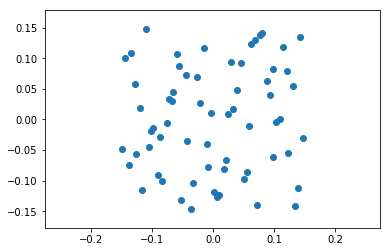

In [10]:
#sample local refined points around wells
n_refine = 64
XY_nearWell_kernel = 0.3*lhs(2, n_refine)-0.15
XY_nearWell = np.empty([0, 2])
for well in WELLs:
   XY_nearWell = np.r_[XY_nearWell, XY_nearWell_kernel+[well['x'],well['y']]]

# XY_nearWell = []
# for well in WELLs:
#     XY_nearWell.append(sample_nearWell(n_refine,radius = 0.05, xy0 = [well['x'],well['y']]))

plt.figure()
plt.scatter(XY_nearWell_kernel[:,0], XY_nearWell_kernel[:,1])
plt.axis('equal')

# XY_nearWell = np.concatenate(XY_nearWell,axis=0)

In [11]:
#initial and boundary condition
XY_initial_S = np.c_[X[:,:,0].flatten(),Y[:,:,0].flatten()]
XY_initial_S = np.r_[XY_initial_S,XY_nearWell]
XYT_initial_S = np.c_[XY_initial_S,np.zeros((XY_initial_S.shape[0],1),dtype=np.float32)]
S_initial = 0.2*np.ones((XYT_initial_S.shape[0],1))

LeftB = np.c_[X[:,0,:].flatten(),Y[:,0,:].flatten(),T[:,0,:].flatten()]
RightB = np.c_[X[:,-1,:].flatten(),Y[:,-1,:].flatten(),T[:,-1,:].flatten()]

XYT_boundary_VX = np.r_[LeftB,RightB]
VX_boundary = np.zeros((XYT_boundary_VX.shape[0],1))

TopB = np.c_[X[0,:,:].flatten(),Y[0,:,:].flatten(),T[0,:,:].flatten()]
BotB = np.c_[X[-1,:,:].flatten(),Y[-1,:,:].flatten(),T[-1,:,:].flatten()]

XYT_boundary_VY = np.r_[TopB,BotB]
VY_boundary = np.zeros((XYT_boundary_VY.shape[0],1))

In [12]:
#collocation points
lb = np.array([x.min(), y.min(), t.min()])
ub = np.array([x.max(), y.max(), t.max()])

#randomly sample points
XYT_f = lb + (ub-lb)*lhs(3, N_f)
# n_t = 17
# n_xy = N_f//n_t
# XYT_f = np.empty([0,3])
# for tmp_t in np.linspace(0,1,n_t):
#   tmp_XY_f = lb[:2] + (ub[:2]-lb[:2])*lhs(2, n_xy)
#   tmp_XYT_f = np.c_[tmp_XY_f,tmp_t*np.ones((n_xy,1))]
#   XYT_f = np.r_[XYT_f,tmp_XYT_f]


T_nearWell = np.linspace(0,1,17).repeat(XY_nearWell.shape[0],axis=0)
XYT_nearWell = np.c_[np.tile(XY_nearWell,[17,1]),T_nearWell]


In [13]:
#assemble points
n_bx, n_by, n_i, n_f, n_nearWell = XYT_boundary_VX.shape[0], XYT_boundary_VY.shape[0], XYT_initial_S.shape[0], XYT_f.shape[0],XYT_nearWell.shape[0]

XYT = np.r_[XYT_boundary_VX, XYT_boundary_VY,XYT_initial_S,XYT_f,XYT_nearWell]
U = np.r_[VX_boundary, VY_boundary, S_initial]

Indices = {'vx': {'begin': 0, 'end': n_bx}, \
           'vy': {'begin': n_bx, 'end': n_bx+n_by}, \
           'sw': {'begin': n_bx+n_by, 'end': n_bx+n_by+n_i}}

In [14]:
print('Initial Condition:      %d points' % n_i)
print('x boundary Condition:   %d points' % n_bx)
print('y boundary Condition:   %d points' % n_by)
print('random collocatiton :   %d points' % XYT_f.shape[0])
print('near well local refine: %d points' % XYT_nearWell.shape[0])
print('i/b conditions        : %d points' % U.shape[0])
print('total points          : %d points' % XYT.shape[0])

Initial Condition:      1344 points
x boundary Condition:   2048 points
y boundary Condition:   2048 points
random collocatiton :   8192 points
near well local refine: 5440 points
i/b conditions        : 5440 points
total points          : 19072 points


***
### Visualing control points
Quickly plotting all control points in $xyt$ 2D+1D spacetime. Here are the explanation on what color means what

| color value | type of control points |
| --- | --- |
| 1 | points on $x=\pm1$ for boundary condition |
| 2 | points on $y=\pm1$ for boundary condition |
| 3 | points at $t=0$ for initial condition |
| 4 | random points for physics |
| 5 | refined points near wells |


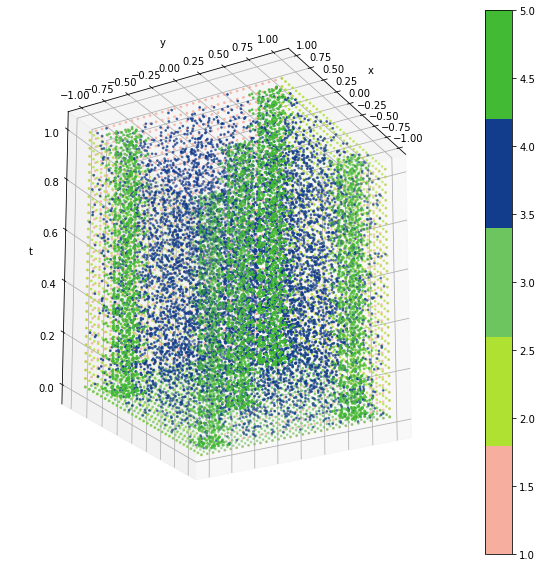

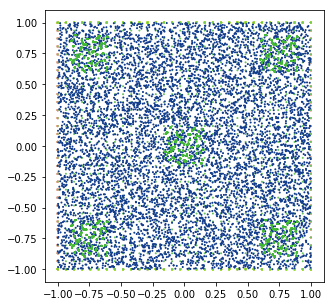

In [15]:
cm = LinearSegmentedColormap.from_list('my_cm',np.random.rand(5,3),N=5)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111,projection='3d')
control_points_type = np.r_[np.ones(n_bx),2*np.ones(n_by),3*np.ones(n_i),4*np.ones(n_f),5*np.ones(n_nearWell)]
p = ax.scatter(XYT[:,0],XYT[:,1],XYT[:,2],c=control_points_type,cmap=cm,s=3)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('t')
fig.colorbar(p)
ax.view_init(-20,30)

fig = plt.figure(figsize=(5,5))
plt.scatter(XYT[:,0],XYT[:,1], c=control_points_type, cmap=cm,s=1)

### Permeability Model
Non-uniform permeability model is not used yet

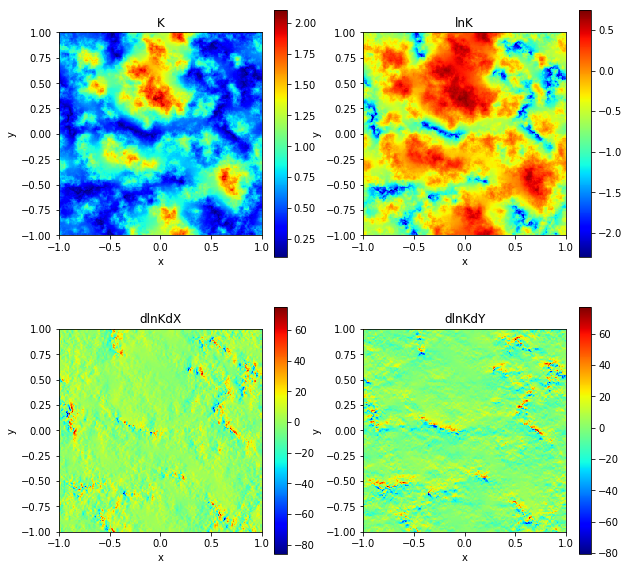

In [16]:
Kmodel = Permeability(np.linspace(-1,1,257),np.linspace(-1,1,257))

***
### Construct the model

In [17]:
model = PhysicsInformedNN(XYT, U, Indices, layers, WELLs, Kmodel, gamma, phi, relpermn)

## Training
We first train the model with 500 iterations of Adam. Then train it with BFGS.

I plot $v_x$, $v_y$, $v$, $s$, $p$ and mismatch in pressure equation, saturation equation and velocity equation after every 10000 iterations. Some of the plots has streamline overlaid plotted by matplotlib streamplot function. Not sure how accurate the streamlines are.

#### Quick takeaway
-  After 1000 iterations (epochs, 3 min GPU), the solution already looks good. At lease the velocity field look very reasonable. The inital saturation is off
-  After 30 min training on GPU, the solution looks really good now. All initial conditions, boundary conditions are honored. The evolution seems correct too.
-  With the trained model, making prediction at any given time for the entire xy domain with 128x128 resolution took about 0.016 second. Probably the greatest benifit of this approach.

Took 0.709473 second to compute 16641 data points at time 0.000000


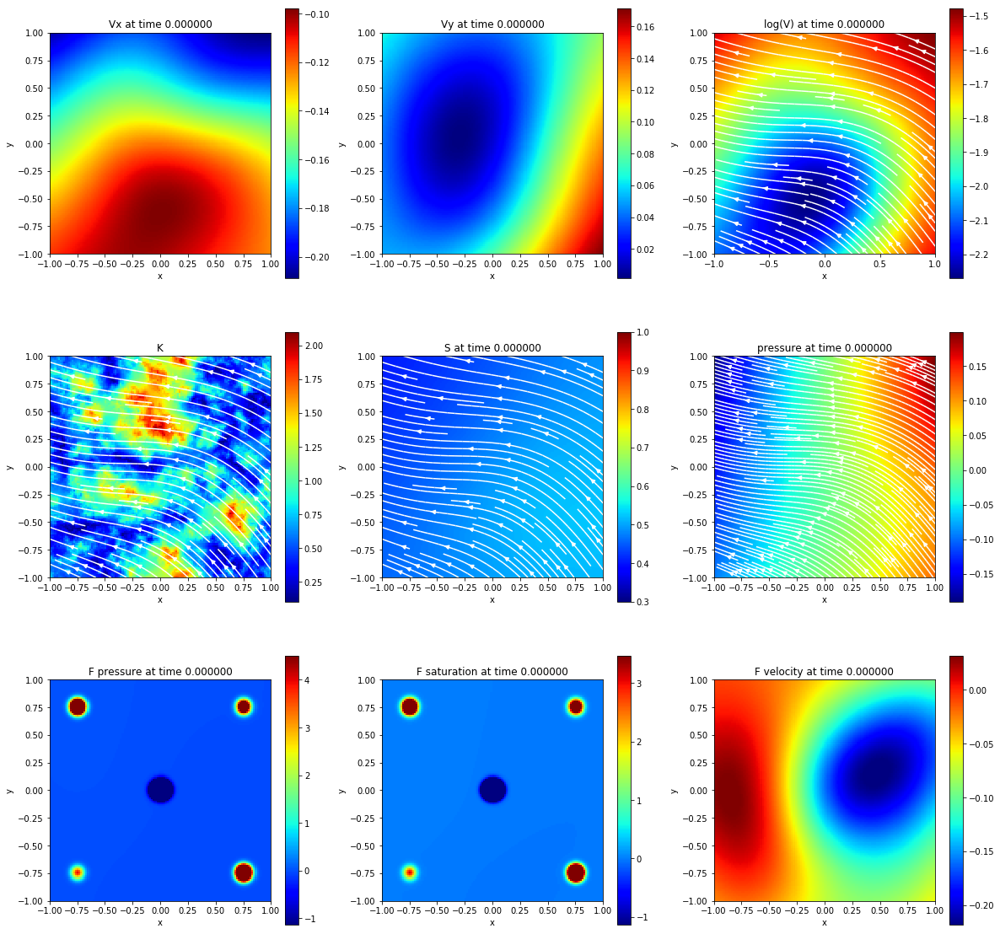

It: 0, Loss: 3.319e+01, Time: 3.69
It: 50, Loss: 2.954e+01, Time: 3.14
It: 100, Loss: 4.594e+00, Time: 3.13
It: 150, Loss: 3.804e+00, Time: 3.13
It: 200, Loss: 3.376e+00, Time: 3.13
It: 250, Loss: 2.840e+00, Time: 3.13
It: 300, Loss: 2.288e+00, Time: 3.13
It: 350, Loss: 1.931e+00, Time: 3.14
It: 400, Loss: 1.622e+00, Time: 3.14
It: 450, Loss: 1.290e+00, Time: 3.13
Iter: 00050, Loss: 7.27e-01, sw: 4.42e-02, vx: 2.36e-02, vy: 2.66e-02, fp: 5.27e-01, fs: 3.94e-02, fv: 6.67e-02
Iter: 00100, Loss: 5.83e-01, sw: 4.72e-02, vx: 1.64e-02, vy: 1.94e-02, fp: 4.31e-01, fs: 2.93e-02, fv: 3.91e-02
Iter: 00150, Loss: 5.22e-01, sw: 4.75e-02, vx: 9.82e-03, vy: 1.70e-02, fp: 3.94e-01, fs: 2.67e-02, fv: 2.72e-02
Iter: 00200, Loss: 4.69e-01, sw: 4.58e-02, vx: 9.15e-03, vy: 1.35e-02, fp: 3.49e-01, fs: 2.69e-02, fv: 2.48e-02
Iter: 00250, Loss: 4.18e-01, sw: 4.39e-02, vx: 9.56e-03, vy: 8.30e-03, fp: 3.05e-01, fs: 2.72e-02, fv: 2.40e-02
Iter: 00300, Loss: 3.61e-01, sw: 4.22e-02, vx: 8.03e-03, vy: 8.00e-03, fp

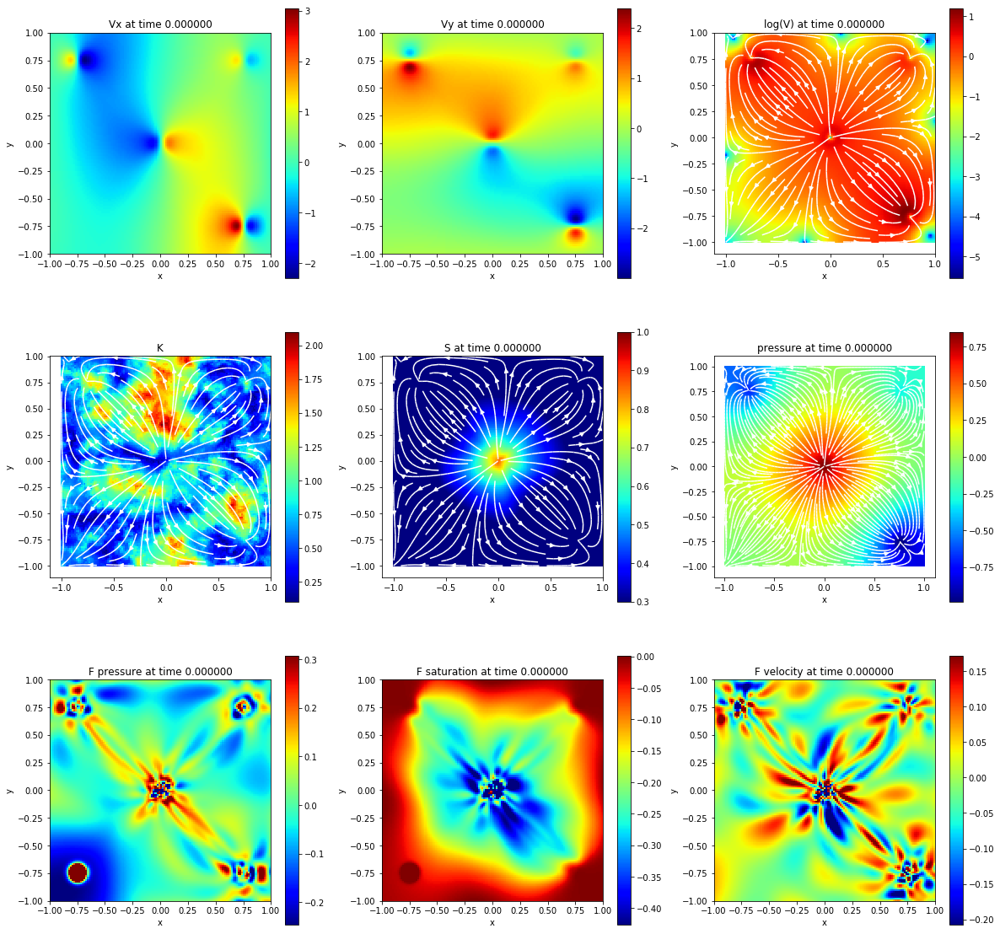

Iter: 00050, Loss: 1.19e-01, sw: 3.40e-02, vx: 3.56e-04, vy: 4.64e-04, fp: 5.96e-02, fs: 2.21e-02, fv: 2.58e-03
Iter: 00100, Loss: 1.18e-01, sw: 3.36e-02, vx: 3.15e-04, vy: 3.97e-04, fp: 5.93e-02, fs: 2.21e-02, fv: 2.20e-03
Iter: 00150, Loss: 1.17e-01, sw: 3.34e-02, vx: 3.18e-04, vy: 4.03e-04, fp: 5.88e-02, fs: 2.21e-02, fv: 2.01e-03
Iter: 00200, Loss: 1.16e-01, sw: 3.29e-02, vx: 2.82e-04, vy: 3.18e-04, fp: 5.88e-02, fs: 2.19e-02, fv: 1.88e-03
Iter: 00250, Loss: 1.15e-01, sw: 3.24e-02, vx: 2.83e-04, vy: 2.96e-04, fp: 5.86e-02, fs: 2.17e-02, fv: 1.78e-03
Iter: 00300, Loss: 1.14e-01, sw: 3.19e-02, vx: 2.63e-04, vy: 2.29e-04, fp: 5.81e-02, fs: 2.18e-02, fv: 1.78e-03
Iter: 00350, Loss: 1.13e-01, sw: 3.14e-02, vx: 2.04e-04, vy: 1.91e-04, fp: 5.77e-02, fs: 2.18e-02, fv: 1.82e-03
Iter: 00400, Loss: 1.12e-01, sw: 3.09e-02, vx: 1.98e-04, vy: 1.48e-04, fp: 5.75e-02, fs: 2.18e-02, fv: 1.82e-03
Iter: 00450, Loss: 1.11e-01, sw: 3.03e-02, vx: 1.71e-04, vy: 1.09e-04, fp: 5.73e-02, fs: 2.17e-02, fv: 1

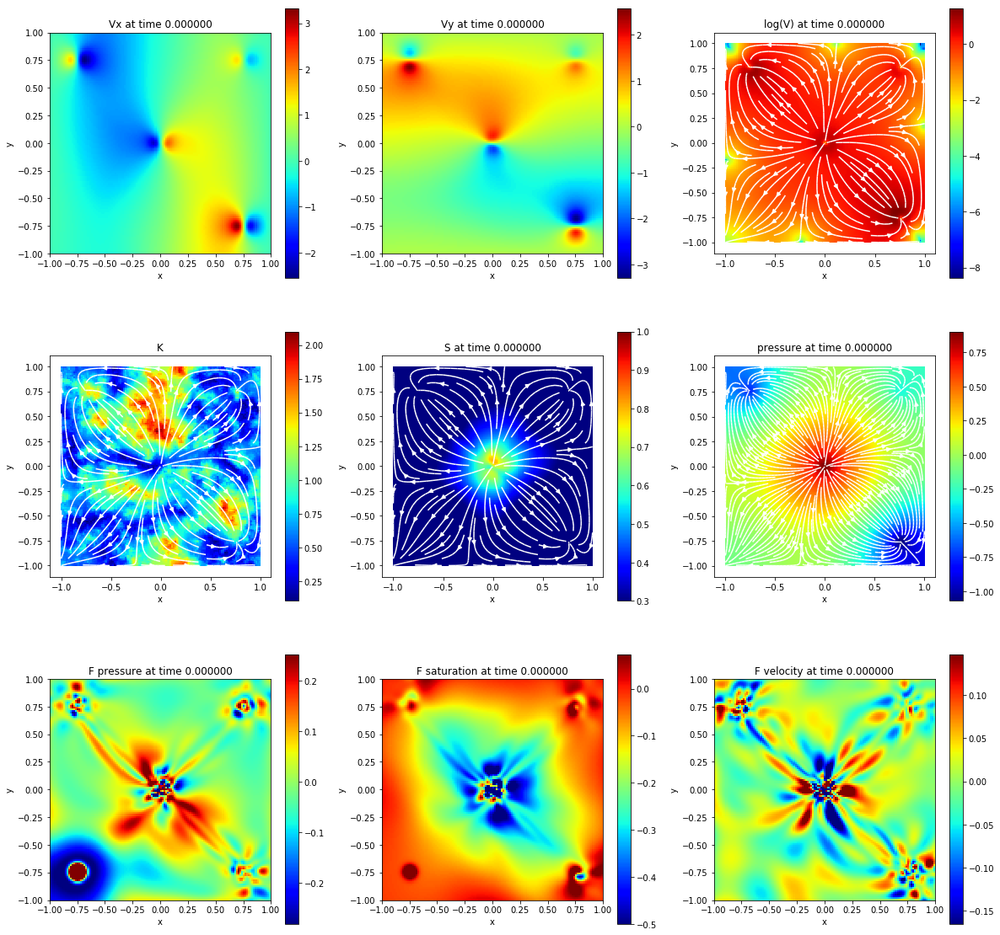

Iter: 00050, Loss: 1.00e-01, sw: 2.44e-02, vx: 1.16e-04, vy: 6.99e-05, fp: 5.43e-02, fs: 1.99e-02, fv: 1.29e-03
Iter: 00100, Loss: 9.95e-02, sw: 2.43e-02, vx: 9.85e-05, vy: 6.36e-05, fp: 5.41e-02, fs: 1.98e-02, fv: 1.21e-03
Iter: 00150, Loss: 9.90e-02, sw: 2.41e-02, vx: 1.03e-04, vy: 7.98e-05, fp: 5.40e-02, fs: 1.96e-02, fv: 1.26e-03
Iter: 00200, Loss: 9.84e-02, sw: 2.36e-02, vx: 1.13e-04, vy: 6.97e-05, fp: 5.38e-02, fs: 1.95e-02, fv: 1.34e-03
Iter: 00250, Loss: 9.76e-02, sw: 2.31e-02, vx: 1.22e-04, vy: 7.40e-05, fp: 5.34e-02, fs: 1.94e-02, fv: 1.55e-03
Iter: 00300, Loss: 9.66e-02, sw: 2.26e-02, vx: 1.38e-04, vy: 9.46e-05, fp: 5.29e-02, fs: 1.91e-02, fv: 1.83e-03
Iter: 00350, Loss: 9.52e-02, sw: 2.21e-02, vx: 1.26e-04, vy: 1.26e-04, fp: 5.19e-02, fs: 1.88e-02, fv: 2.18e-03
Iter: 00400, Loss: 9.41e-02, sw: 2.18e-02, vx: 1.65e-04, vy: 1.31e-04, fp: 5.12e-02, fs: 1.86e-02, fv: 2.23e-03
Iter: 00450, Loss: 9.27e-02, sw: 2.15e-02, vx: 2.33e-04, vy: 1.24e-04, fp: 5.03e-02, fs: 1.83e-02, fv: 2

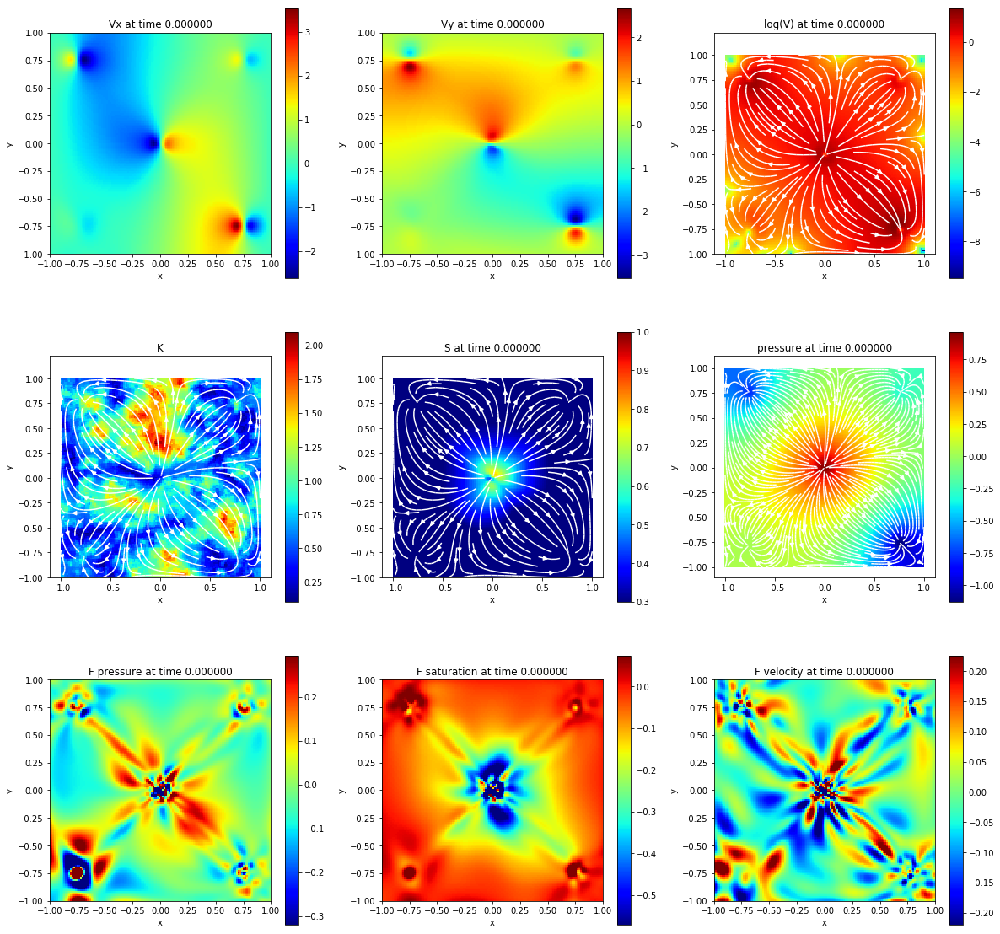

Iter: 00050, Loss: 6.46e-02, sw: 1.86e-02, vx: 2.32e-04, vy: 6.36e-04, fp: 2.67e-02, fs: 1.45e-02, fv: 3.99e-03
Iter: 00100, Loss: 6.16e-02, sw: 1.87e-02, vx: 2.36e-04, vy: 5.04e-04, fp: 2.43e-02, fs: 1.43e-02, fv: 3.53e-03
Iter: 00150, Loss: 5.85e-02, sw: 1.88e-02, vx: 3.83e-04, vy: 4.71e-04, fp: 2.16e-02, fs: 1.40e-02, fv: 3.29e-03
Iter: 00200, Loss: 5.46e-02, sw: 1.89e-02, vx: 3.12e-04, vy: 3.77e-04, fp: 1.77e-02, fs: 1.34e-02, fv: 3.84e-03
Iter: 00250, Loss: 5.00e-02, sw: 1.83e-02, vx: 2.47e-04, vy: 3.65e-04, fp: 1.40e-02, fs: 1.35e-02, fv: 3.57e-03
Iter: 00300, Loss: 4.68e-02, sw: 1.84e-02, vx: 2.48e-04, vy: 3.14e-04, fp: 1.14e-02, fs: 1.29e-02, fv: 3.47e-03
Iter: 00350, Loss: 4.36e-02, sw: 1.84e-02, vx: 1.85e-04, vy: 2.90e-04, fp: 9.05e-03, fs: 1.25e-02, fv: 3.21e-03
Iter: 00400, Loss: 4.18e-02, sw: 1.83e-02, vx: 1.38e-04, vy: 3.53e-04, fp: 7.73e-03, fs: 1.24e-02, fv: 2.92e-03
Iter: 00450, Loss: 4.03e-02, sw: 1.80e-02, vx: 1.46e-04, vy: 3.37e-04, fp: 6.96e-03, fs: 1.21e-02, fv: 2

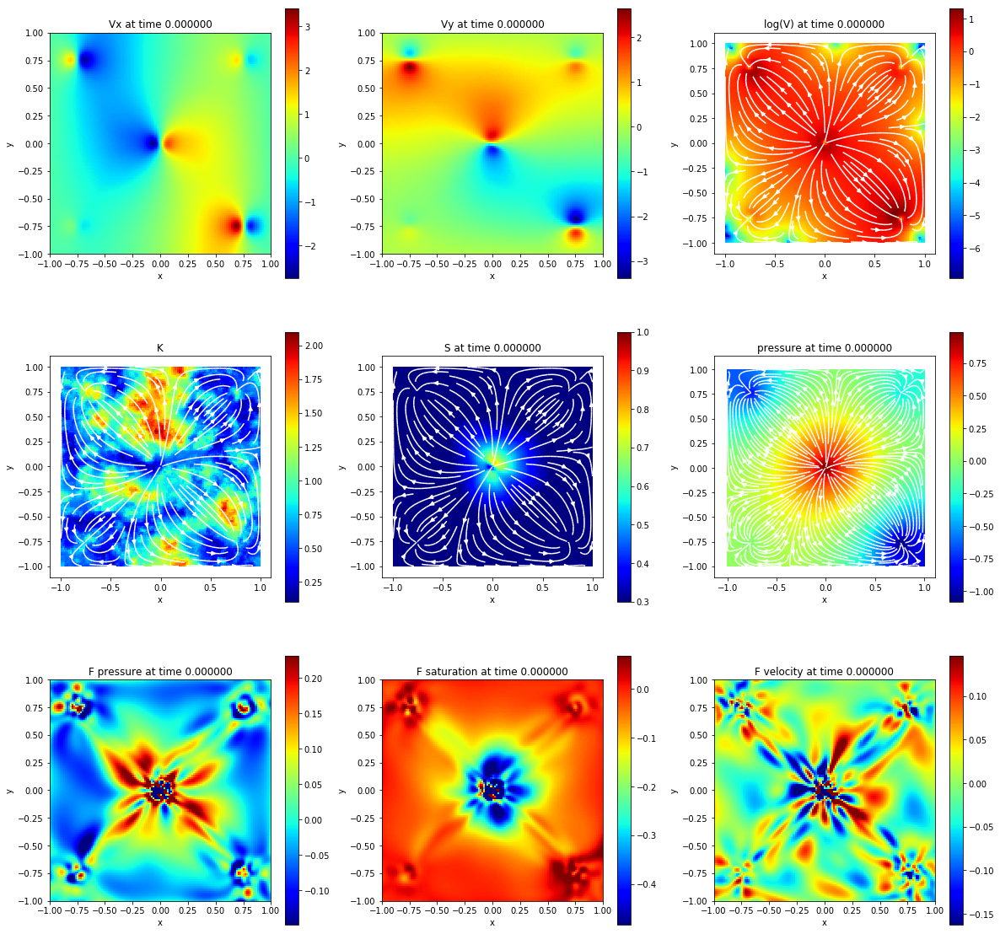

Iter: 00050, Loss: 3.06e-02, sw: 1.56e-02, vx: 9.15e-05, vy: 9.57e-05, fp: 4.08e-03, fs: 9.20e-03, fv: 1.47e-03
Iter: 00100, Loss: 3.02e-02, sw: 1.55e-02, vx: 9.14e-05, vy: 9.25e-05, fp: 3.95e-03, fs: 9.23e-03, fv: 1.35e-03
Iter: 00150, Loss: 3.00e-02, sw: 1.55e-02, vx: 9.02e-05, vy: 9.40e-05, fp: 3.83e-03, fs: 9.19e-03, fv: 1.29e-03
Iter: 00200, Loss: 2.97e-02, sw: 1.54e-02, vx: 8.14e-05, vy: 8.74e-05, fp: 3.73e-03, fs: 9.16e-03, fv: 1.25e-03
Iter: 00250, Loss: 2.93e-02, sw: 1.52e-02, vx: 7.21e-05, vy: 7.76e-05, fp: 3.72e-03, fs: 9.00e-03, fv: 1.25e-03
Iter: 00300, Loss: 2.90e-02, sw: 1.49e-02, vx: 6.38e-05, vy: 8.15e-05, fp: 3.73e-03, fs: 8.95e-03, fv: 1.28e-03
Iter: 00350, Loss: 2.85e-02, sw: 1.46e-02, vx: 5.70e-05, vy: 7.35e-05, fp: 3.77e-03, fs: 8.76e-03, fv: 1.29e-03
Iter: 00400, Loss: 2.81e-02, sw: 1.44e-02, vx: 5.73e-05, vy: 6.94e-05, fp: 3.77e-03, fs: 8.52e-03, fv: 1.33e-03
Iter: 00450, Loss: 2.76e-02, sw: 1.39e-02, vx: 5.91e-05, vy: 6.60e-05, fp: 3.75e-03, fs: 8.37e-03, fv: 1

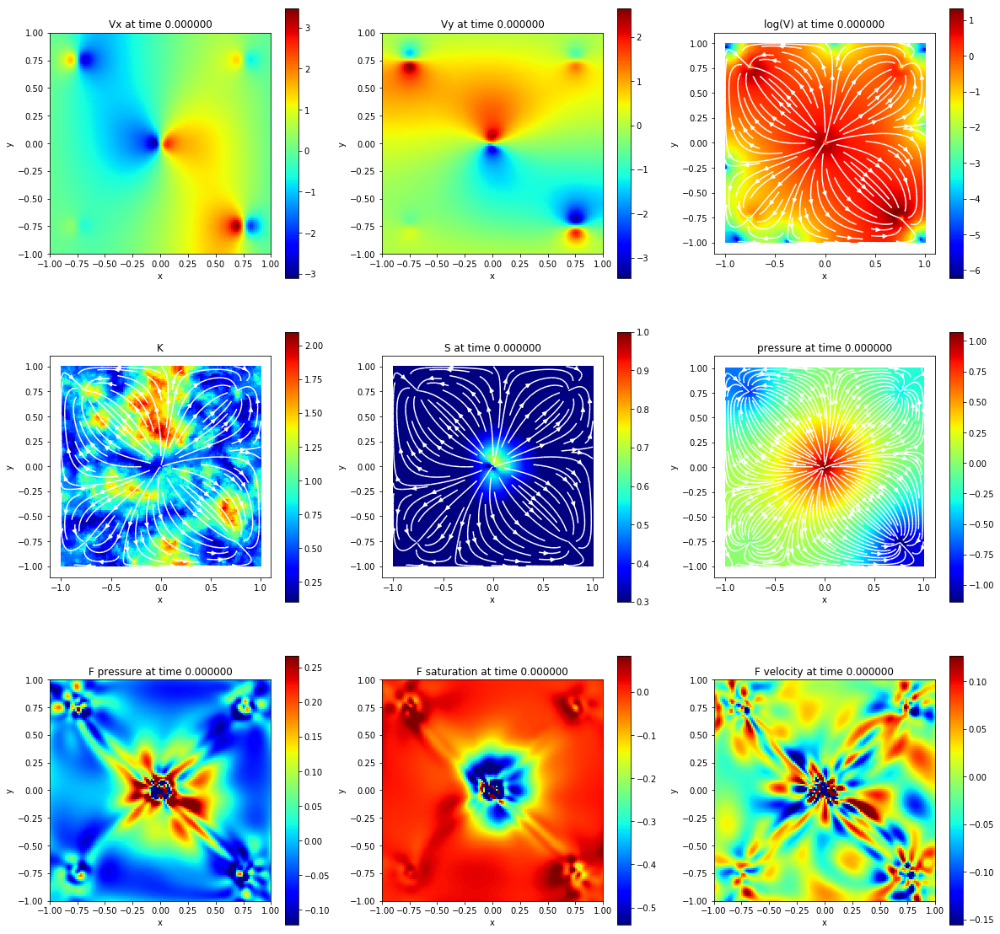

Iter: 00050, Loss: 2.17e-02, sw: 1.11e-02, vx: 7.60e-05, vy: 5.65e-05, fp: 3.20e-03, fs: 6.07e-03, fv: 1.28e-03
Iter: 00100, Loss: 2.15e-02, sw: 1.09e-02, vx: 7.24e-05, vy: 5.17e-05, fp: 3.18e-03, fs: 6.07e-03, fv: 1.18e-03
Iter: 00150, Loss: 2.13e-02, sw: 1.09e-02, vx: 7.15e-05, vy: 5.25e-05, fp: 3.16e-03, fs: 5.99e-03, fv: 1.12e-03
Iter: 00200, Loss: 2.10e-02, sw: 1.09e-02, vx: 7.41e-05, vy: 4.90e-05, fp: 3.09e-03, fs: 5.90e-03, fv: 1.07e-03
Iter: 00250, Loss: 2.08e-02, sw: 1.07e-02, vx: 6.92e-05, vy: 4.71e-05, fp: 3.09e-03, fs: 5.80e-03, fv: 1.03e-03
Iter: 00300, Loss: 2.06e-02, sw: 1.06e-02, vx: 6.70e-05, vy: 4.64e-05, fp: 3.11e-03, fs: 5.74e-03, fv: 1.00e-03
Iter: 00350, Loss: 2.03e-02, sw: 1.05e-02, vx: 6.35e-05, vy: 4.50e-05, fp: 3.08e-03, fs: 5.70e-03, fv: 9.77e-04
Iter: 00400, Loss: 2.01e-02, sw: 1.04e-02, vx: 6.18e-05, vy: 5.03e-05, fp: 3.07e-03, fs: 5.52e-03, fv: 9.71e-04
Iter: 00450, Loss: 1.99e-02, sw: 1.03e-02, vx: 6.14e-05, vy: 5.10e-05, fp: 2.97e-03, fs: 5.50e-03, fv: 9

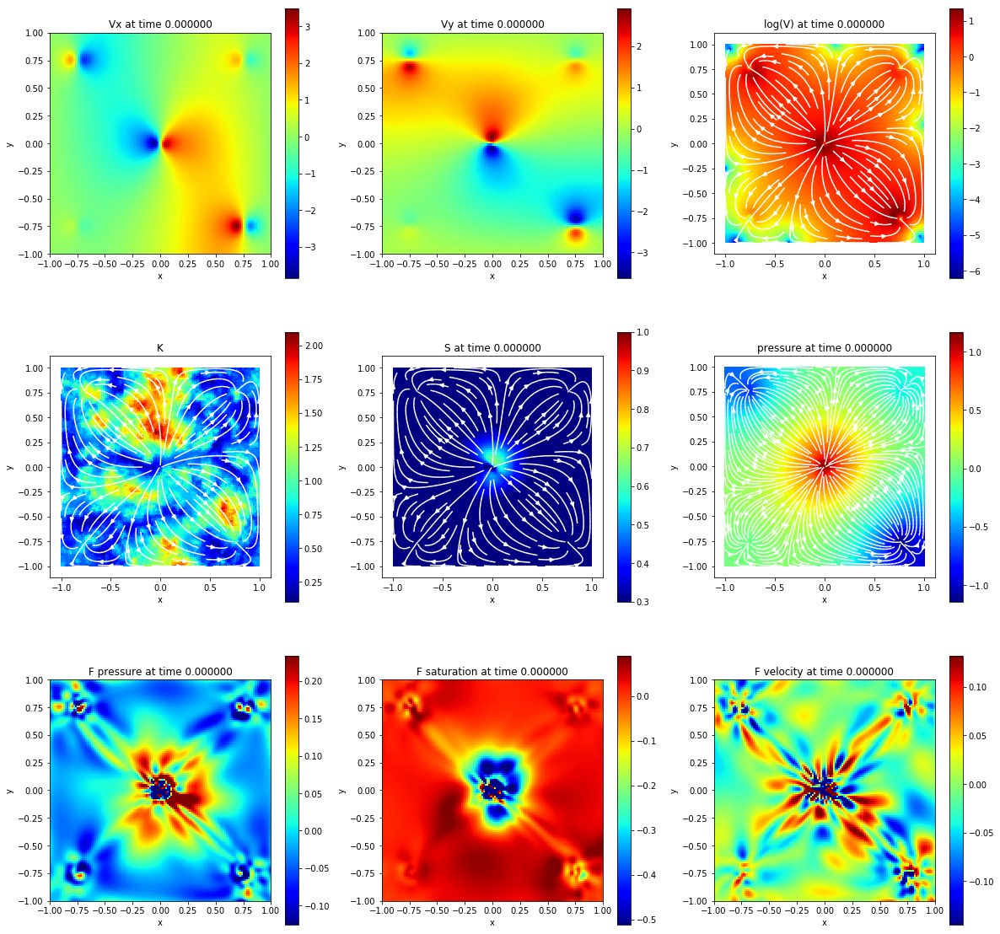

Iter: 00050, Loss: 1.57e-02, sw: 7.97e-03, vx: 4.74e-05, vy: 5.50e-05, fp: 2.43e-03, fs: 4.10e-03, fv: 1.09e-03
Iter: 00100, Loss: 1.55e-02, sw: 7.96e-03, vx: 4.32e-05, vy: 5.13e-05, fp: 2.37e-03, fs: 4.06e-03, fv: 1.01e-03
Iter: 00150, Loss: 1.53e-02, sw: 7.90e-03, vx: 4.13e-05, vy: 4.83e-05, fp: 2.37e-03, fs: 4.02e-03, fv: 9.52e-04
Iter: 00200, Loss: 1.52e-02, sw: 7.80e-03, vx: 3.83e-05, vy: 4.84e-05, fp: 2.38e-03, fs: 4.00e-03, fv: 9.03e-04
Iter: 00250, Loss: 1.50e-02, sw: 7.72e-03, vx: 4.00e-05, vy: 4.42e-05, fp: 2.32e-03, fs: 3.99e-03, fv: 8.64e-04
Iter: 00300, Loss: 1.48e-02, sw: 7.62e-03, vx: 4.09e-05, vy: 4.18e-05, fp: 2.29e-03, fs: 3.99e-03, fv: 8.43e-04
Iter: 00350, Loss: 1.47e-02, sw: 7.49e-03, vx: 4.05e-05, vy: 4.34e-05, fp: 2.28e-03, fs: 3.98e-03, fv: 8.20e-04
Iter: 00400, Loss: 1.45e-02, sw: 7.38e-03, vx: 3.72e-05, vy: 4.54e-05, fp: 2.23e-03, fs: 3.97e-03, fv: 8.04e-04
Iter: 00450, Loss: 1.42e-02, sw: 7.20e-03, vx: 3.64e-05, vy: 4.60e-05, fp: 2.14e-03, fs: 3.98e-03, fv: 8

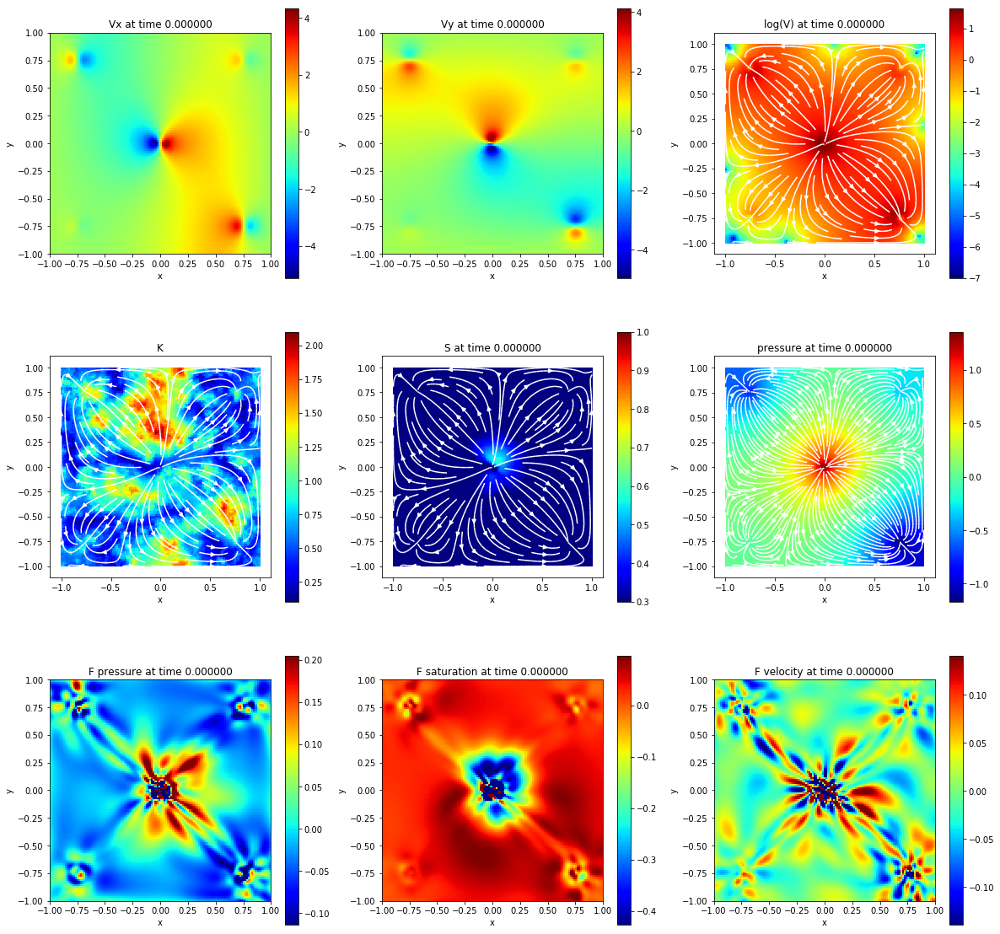

Iter: 00050, Loss: 1.10e-02, sw: 5.09e-03, vx: 3.79e-05, vy: 4.19e-05, fp: 1.78e-03, fs: 3.09e-03, fv: 9.87e-04
Iter: 00100, Loss: 1.09e-02, sw: 5.11e-03, vx: 3.49e-05, vy: 3.93e-05, fp: 1.72e-03, fs: 3.04e-03, fv: 9.06e-04
Iter: 00150, Loss: 1.07e-02, sw: 5.07e-03, vx: 3.39e-05, vy: 3.40e-05, fp: 1.72e-03, fs: 3.01e-03, fv: 8.60e-04
Iter: 00200, Loss: 1.06e-02, sw: 5.04e-03, vx: 3.29e-05, vy: 3.47e-05, fp: 1.66e-03, fs: 3.01e-03, fv: 8.27e-04
Iter: 00250, Loss: 1.05e-02, sw: 5.03e-03, vx: 3.35e-05, vy: 3.10e-05, fp: 1.62e-03, fs: 2.98e-03, fv: 7.80e-04
Iter: 00300, Loss: 1.04e-02, sw: 5.01e-03, vx: 3.11e-05, vy: 3.01e-05, fp: 1.59e-03, fs: 2.97e-03, fv: 7.56e-04
Iter: 00350, Loss: 1.03e-02, sw: 4.95e-03, vx: 3.02e-05, vy: 2.97e-05, fp: 1.59e-03, fs: 2.92e-03, fv: 7.45e-04
Iter: 00400, Loss: 1.02e-02, sw: 4.91e-03, vx: 3.03e-05, vy: 3.05e-05, fp: 1.55e-03, fs: 2.90e-03, fv: 7.41e-04
Iter: 00450, Loss: 1.00e-02, sw: 4.86e-03, vx: 3.10e-05, vy: 3.21e-05, fp: 1.48e-03, fs: 2.86e-03, fv: 7

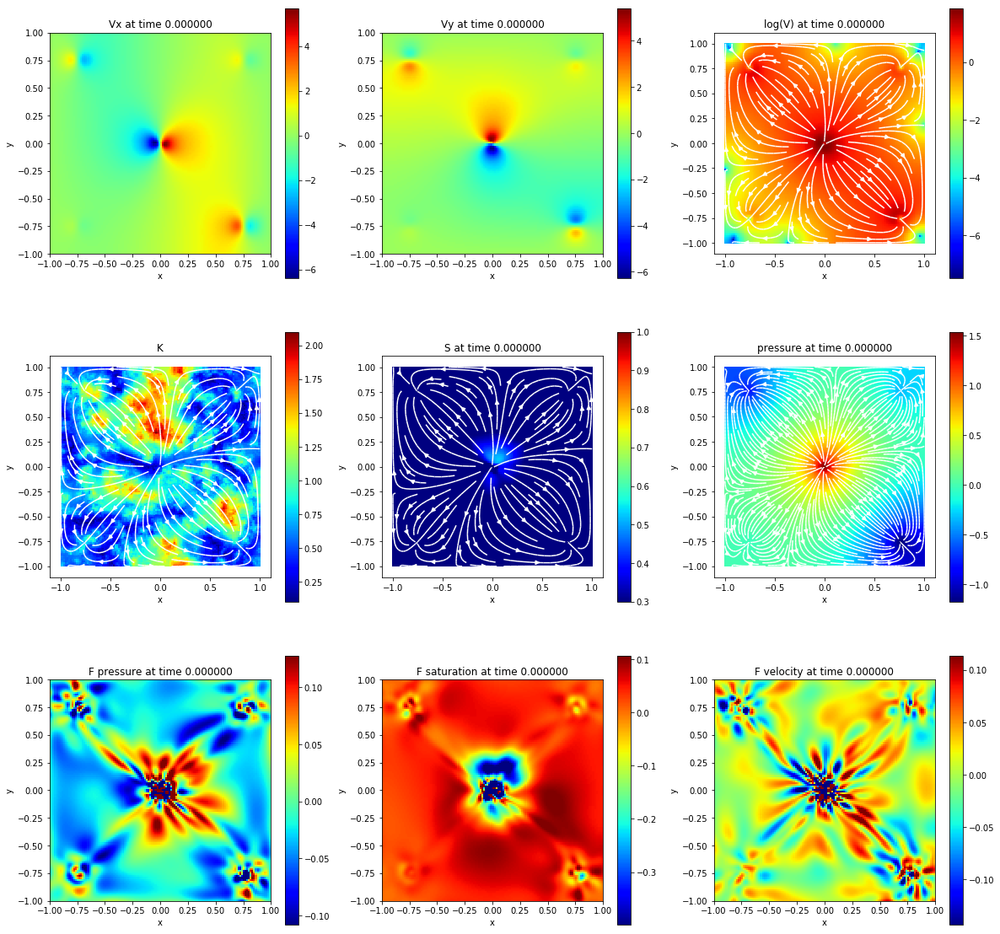

Iter: 00050, Loss: 7.91e-03, sw: 3.50e-03, vx: 2.67e-05, vy: 3.03e-05, fp: 1.36e-03, fs: 2.25e-03, fv: 7.41e-04
Iter: 00100, Loss: 7.81e-03, sw: 3.51e-03, vx: 2.80e-05, vy: 2.89e-05, fp: 1.31e-03, fs: 2.24e-03, fv: 6.96e-04
Iter: 00150, Loss: 7.72e-03, sw: 3.51e-03, vx: 2.84e-05, vy: 2.93e-05, fp: 1.28e-03, fs: 2.21e-03, fv: 6.61e-04
Iter: 00200, Loss: 7.63e-03, sw: 3.49e-03, vx: 2.75e-05, vy: 2.82e-05, fp: 1.25e-03, fs: 2.21e-03, fv: 6.31e-04
Iter: 00250, Loss: 7.54e-03, sw: 3.45e-03, vx: 2.44e-05, vy: 2.72e-05, fp: 1.22e-03, fs: 2.21e-03, fv: 6.06e-04
Iter: 00300, Loss: 7.48e-03, sw: 3.41e-03, vx: 2.43e-05, vy: 2.66e-05, fp: 1.22e-03, fs: 2.21e-03, fv: 5.90e-04
Iter: 00350, Loss: 7.39e-03, sw: 3.37e-03, vx: 2.53e-05, vy: 2.62e-05, fp: 1.20e-03, fs: 2.20e-03, fv: 5.72e-04
Iter: 00400, Loss: 7.33e-03, sw: 3.35e-03, vx: 2.75e-05, vy: 2.50e-05, fp: 1.18e-03, fs: 2.19e-03, fv: 5.62e-04
Iter: 00450, Loss: 7.26e-03, sw: 3.31e-03, vx: 2.72e-05, vy: 2.46e-05, fp: 1.16e-03, fs: 2.19e-03, fv: 5

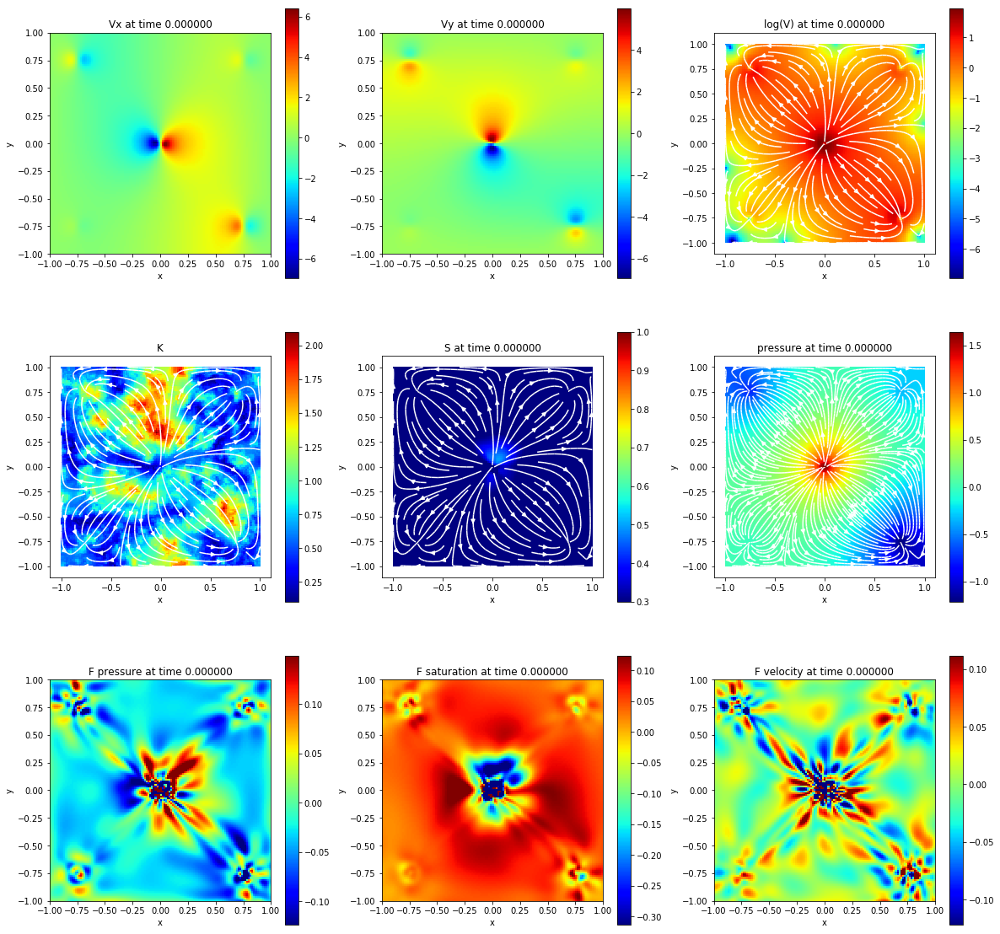

Iter: 00050, Loss: 6.19e-03, sw: 2.62e-03, vx: 3.18e-05, vy: 2.43e-05, fp: 1.07e-03, fs: 1.88e-03, fv: 5.68e-04
Iter: 00100, Loss: 6.12e-03, sw: 2.63e-03, vx: 3.14e-05, vy: 2.35e-05, fp: 1.04e-03, fs: 1.86e-03, fv: 5.35e-04
Iter: 00150, Loss: 6.06e-03, sw: 2.63e-03, vx: 3.08e-05, vy: 2.14e-05, fp: 1.04e-03, fs: 1.84e-03, fv: 5.11e-04
Iter: 00200, Loss: 6.02e-03, sw: 2.59e-03, vx: 3.13e-05, vy: 2.11e-05, fp: 1.02e-03, fs: 1.85e-03, fv: 4.98e-04
Iter: 00250, Loss: 5.96e-03, sw: 2.59e-03, vx: 2.95e-05, vy: 2.17e-05, fp: 1.01e-03, fs: 1.83e-03, fv: 4.80e-04
Iter: 00300, Loss: 5.92e-03, sw: 2.58e-03, vx: 2.83e-05, vy: 2.10e-05, fp: 9.90e-04, fs: 1.83e-03, fv: 4.73e-04
Iter: 00350, Loss: 5.86e-03, sw: 2.56e-03, vx: 2.79e-05, vy: 2.05e-05, fp: 9.70e-04, fs: 1.82e-03, fv: 4.62e-04
Iter: 00400, Loss: 5.82e-03, sw: 2.55e-03, vx: 2.80e-05, vy: 1.98e-05, fp: 9.63e-04, fs: 1.81e-03, fv: 4.57e-04
Iter: 00450, Loss: 5.77e-03, sw: 2.54e-03, vx: 2.66e-05, vy: 1.99e-05, fp: 9.60e-04, fs: 1.77e-03, fv: 4

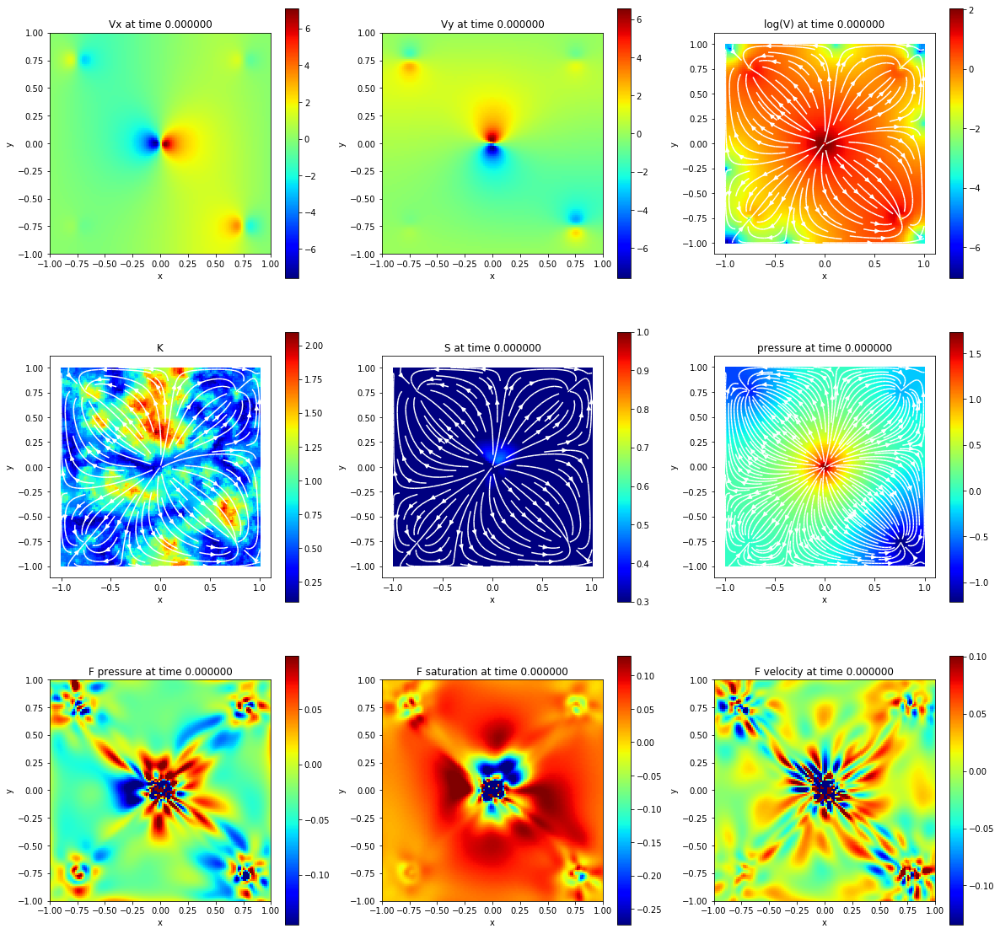

Iter: 00050, Loss: 5.13e-03, sw: 2.10e-03, vx: 2.40e-05, vy: 2.14e-05, fp: 9.21e-04, fs: 1.60e-03, fv: 4.65e-04
Iter: 00100, Loss: 5.08e-03, sw: 2.10e-03, vx: 2.36e-05, vy: 2.05e-05, fp: 8.96e-04, fs: 1.60e-03, fv: 4.41e-04
Iter: 00150, Loss: 5.05e-03, sw: 2.10e-03, vx: 2.54e-05, vy: 2.07e-05, fp: 8.85e-04, fs: 1.59e-03, fv: 4.28e-04
Iter: 00200, Loss: 5.01e-03, sw: 2.08e-03, vx: 2.49e-05, vy: 2.00e-05, fp: 8.79e-04, fs: 1.59e-03, fv: 4.16e-04
Iter: 00250, Loss: 4.97e-03, sw: 2.07e-03, vx: 2.36e-05, vy: 1.98e-05, fp: 8.66e-04, fs: 1.59e-03, fv: 4.05e-04
Iter: 00300, Loss: 4.94e-03, sw: 2.06e-03, vx: 2.31e-05, vy: 1.95e-05, fp: 8.53e-04, fs: 1.59e-03, fv: 3.96e-04
Iter: 00350, Loss: 4.90e-03, sw: 2.05e-03, vx: 2.35e-05, vy: 1.91e-05, fp: 8.42e-04, fs: 1.58e-03, fv: 3.90e-04
Iter: 00400, Loss: 4.88e-03, sw: 2.05e-03, vx: 2.38e-05, vy: 1.89e-05, fp: 8.35e-04, fs: 1.57e-03, fv: 3.86e-04
Iter: 00450, Loss: 4.85e-03, sw: 2.03e-03, vx: 2.45e-05, vy: 1.87e-05, fp: 8.26e-04, fs: 1.56e-03, fv: 3

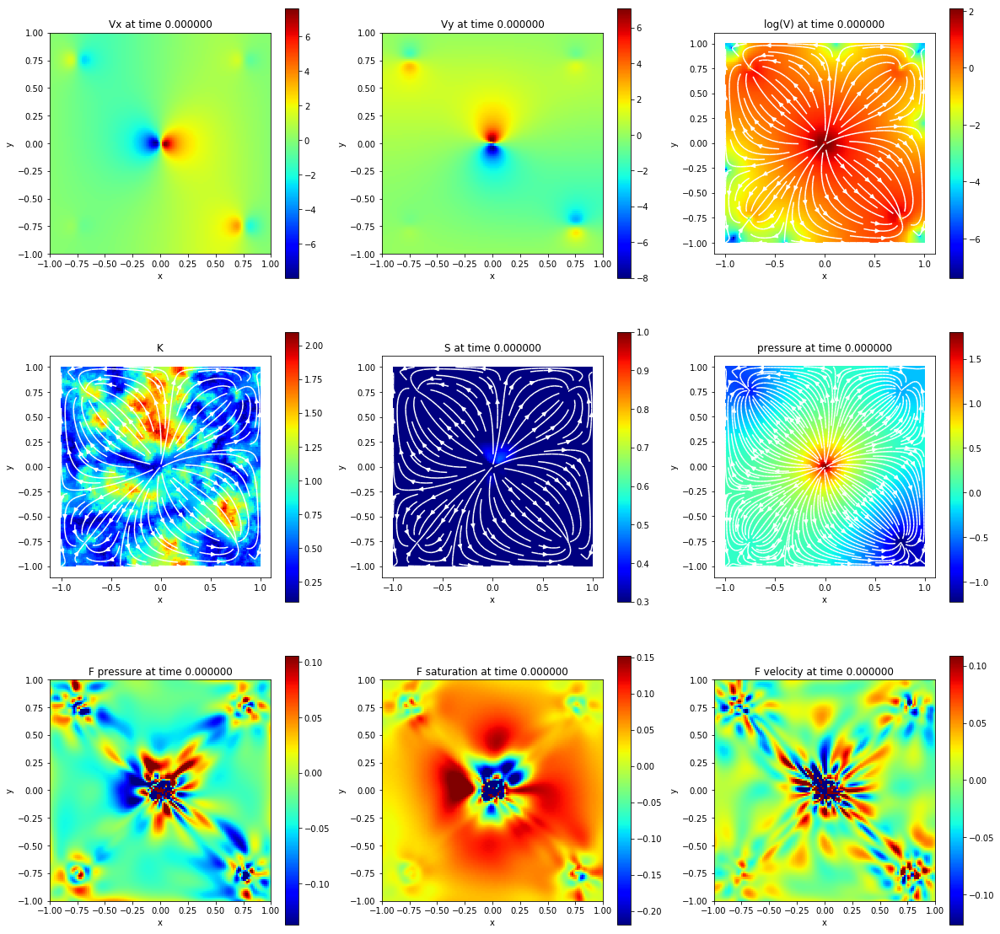

Iter: 00050, Loss: 4.36e-03, sw: 1.67e-03, vx: 2.84e-05, vy: 2.01e-05, fp: 8.03e-04, fs: 1.42e-03, fv: 4.17e-04
Iter: 00100, Loss: 4.32e-03, sw: 1.66e-03, vx: 2.78e-05, vy: 1.94e-05, fp: 7.91e-04, fs: 1.42e-03, fv: 3.99e-04
Iter: 00150, Loss: 4.29e-03, sw: 1.65e-03, vx: 2.75e-05, vy: 1.90e-05, fp: 7.88e-04, fs: 1.42e-03, fv: 3.86e-04
Iter: 00200, Loss: 4.26e-03, sw: 1.65e-03, vx: 2.71e-05, vy: 1.89e-05, fp: 7.79e-04, fs: 1.42e-03, fv: 3.74e-04
Iter: 00250, Loss: 4.24e-03, sw: 1.65e-03, vx: 2.71e-05, vy: 1.89e-05, fp: 7.68e-04, fs: 1.41e-03, fv: 3.64e-04
Iter: 00300, Loss: 4.22e-03, sw: 1.65e-03, vx: 2.63e-05, vy: 1.83e-05, fp: 7.65e-04, fs: 1.40e-03, fv: 3.57e-04
Iter: 00350, Loss: 4.19e-03, sw: 1.64e-03, vx: 2.59e-05, vy: 1.78e-05, fp: 7.55e-04, fs: 1.40e-03, fv: 3.49e-04
Iter: 00400, Loss: 4.17e-03, sw: 1.64e-03, vx: 2.58e-05, vy: 1.80e-05, fp: 7.50e-04, fs: 1.39e-03, fv: 3.44e-04
Iter: 00450, Loss: 4.14e-03, sw: 1.63e-03, vx: 2.52e-05, vy: 1.70e-05, fp: 7.42e-04, fs: 1.39e-03, fv: 3

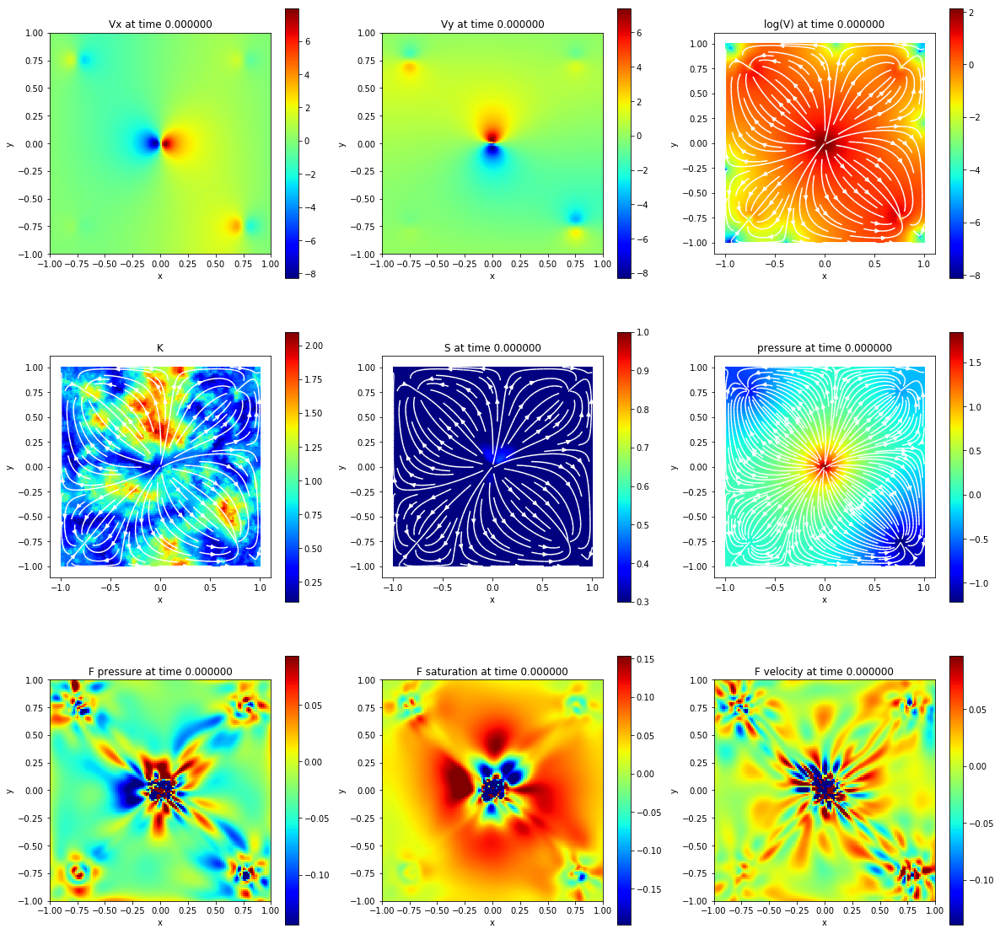

Iter: 00050, Loss: 3.86e-03, sw: 1.43e-03, vx: 2.26e-05, vy: 1.85e-05, fp: 7.27e-04, fs: 1.33e-03, fv: 3.34e-04
Iter: 00100, Loss: 3.84e-03, sw: 1.43e-03, vx: 2.24e-05, vy: 1.81e-05, fp: 7.14e-04, fs: 1.33e-03, fv: 3.25e-04
Iter: 00150, Loss: 3.82e-03, sw: 1.43e-03, vx: 2.30e-05, vy: 1.82e-05, fp: 7.11e-04, fs: 1.32e-03, fv: 3.17e-04
Iter: 00200, Loss: 3.80e-03, sw: 1.42e-03, vx: 2.29e-05, vy: 1.82e-05, fp: 7.06e-04, fs: 1.32e-03, fv: 3.12e-04
Iter: 00250, Loss: 3.79e-03, sw: 1.41e-03, vx: 2.31e-05, vy: 1.78e-05, fp: 7.04e-04, fs: 1.32e-03, fv: 3.08e-04
Iter: 00300, Loss: 3.77e-03, sw: 1.41e-03, vx: 2.25e-05, vy: 1.74e-05, fp: 6.98e-04, fs: 1.32e-03, fv: 3.05e-04
Iter: 00350, Loss: 3.75e-03, sw: 1.41e-03, vx: 2.25e-05, vy: 1.72e-05, fp: 6.90e-04, fs: 1.32e-03, fv: 3.02e-04
Iter: 00400, Loss: 3.74e-03, sw: 1.40e-03, vx: 2.30e-05, vy: 1.75e-05, fp: 6.88e-04, fs: 1.31e-03, fv: 3.00e-04
Iter: 00450, Loss: 3.72e-03, sw: 1.39e-03, vx: 2.34e-05, vy: 1.71e-05, fp: 6.82e-04, fs: 1.31e-03, fv: 2

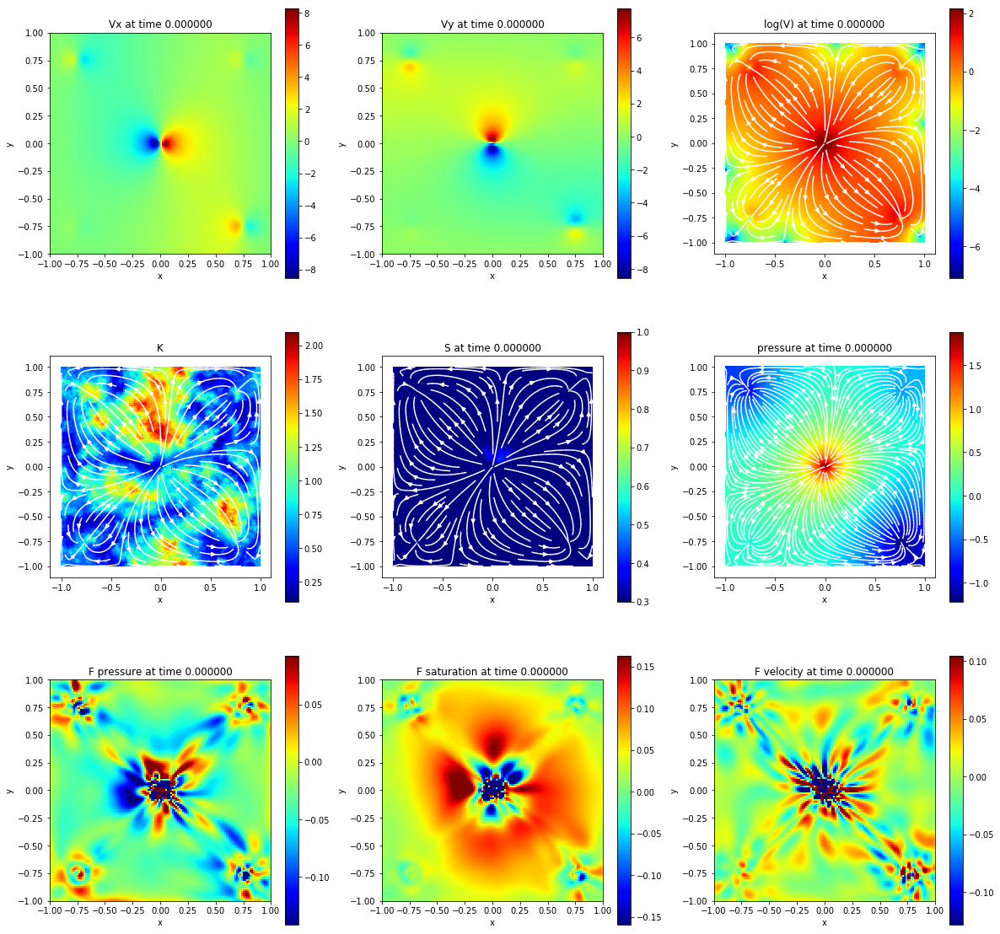

Iter: 00050, Loss: 3.48e-03, sw: 1.20e-03, vx: 2.40e-05, vy: 1.72e-05, fp: 6.81e-04, fs: 1.24e-03, fv: 3.10e-04
Iter: 00100, Loss: 3.46e-03, sw: 1.20e-03, vx: 2.35e-05, vy: 1.69e-05, fp: 6.79e-04, fs: 1.23e-03, fv: 3.02e-04
Iter: 00150, Loss: 3.44e-03, sw: 1.20e-03, vx: 2.34e-05, vy: 1.70e-05, fp: 6.74e-04, fs: 1.23e-03, fv: 2.96e-04
Iter: 00200, Loss: 3.43e-03, sw: 1.20e-03, vx: 2.36e-05, vy: 1.70e-05, fp: 6.74e-04, fs: 1.23e-03, fv: 2.91e-04
Iter: 00250, Loss: 3.42e-03, sw: 1.19e-03, vx: 2.35e-05, vy: 1.74e-05, fp: 6.63e-04, fs: 1.24e-03, fv: 2.86e-04
Iter: 00300, Loss: 3.40e-03, sw: 1.19e-03, vx: 2.32e-05, vy: 1.67e-05, fp: 6.60e-04, fs: 1.23e-03, fv: 2.82e-04
Iter: 00350, Loss: 3.39e-03, sw: 1.19e-03, vx: 2.31e-05, vy: 1.66e-05, fp: 6.50e-04, fs: 1.23e-03, fv: 2.76e-04
Iter: 00400, Loss: 3.37e-03, sw: 1.18e-03, vx: 2.29e-05, vy: 1.63e-05, fp: 6.51e-04, fs: 1.23e-03, fv: 2.72e-04
Iter: 00450, Loss: 3.36e-03, sw: 1.18e-03, vx: 2.26e-05, vy: 1.58e-05, fp: 6.47e-04, fs: 1.22e-03, fv: 2

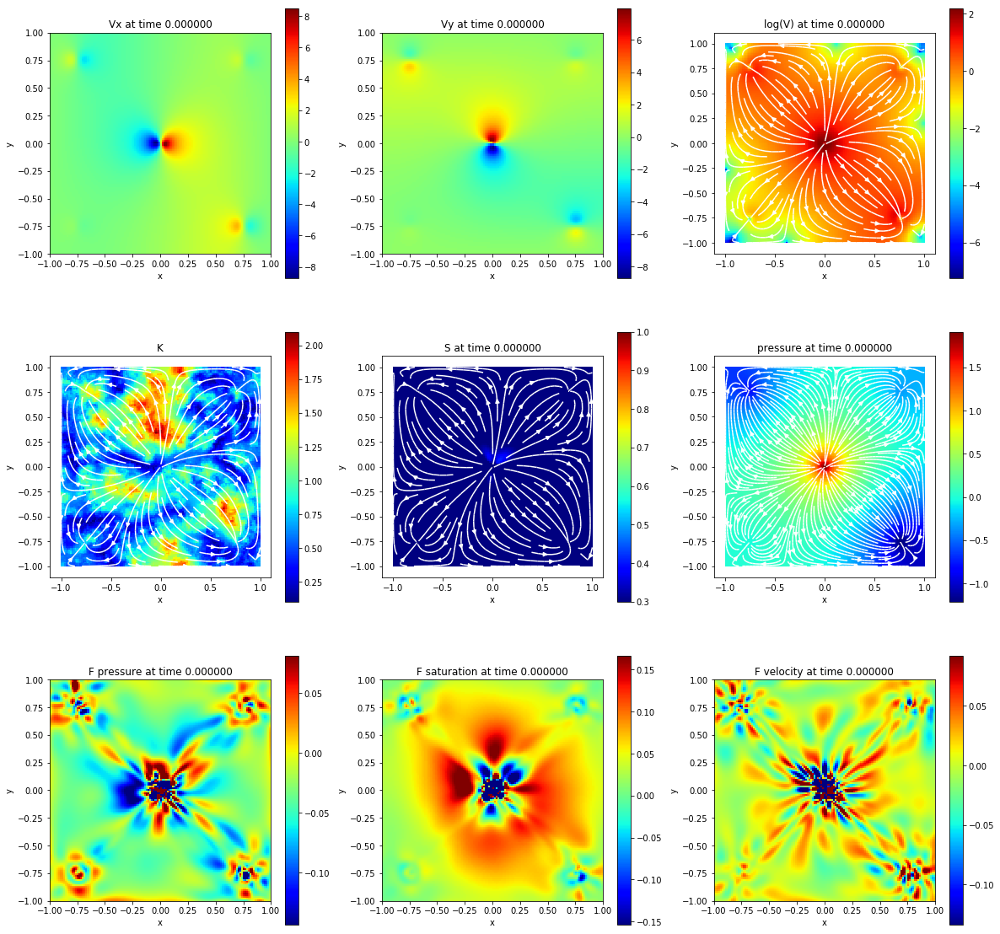

Iter: 00050, Loss: 3.19e-03, sw: 1.06e-03, vx: 2.08e-05, vy: 1.70e-05, fp: 6.38e-04, fs: 1.19e-03, fv: 2.66e-04
Iter: 00100, Loss: 3.18e-03, sw: 1.06e-03, vx: 2.04e-05, vy: 1.68e-05, fp: 6.27e-04, fs: 1.19e-03, fv: 2.60e-04
Iter: 00150, Loss: 3.17e-03, sw: 1.06e-03, vx: 2.06e-05, vy: 1.66e-05, fp: 6.27e-04, fs: 1.19e-03, fv: 2.57e-04
Iter: 00200, Loss: 3.15e-03, sw: 1.06e-03, vx: 2.10e-05, vy: 1.67e-05, fp: 6.25e-04, fs: 1.18e-03, fv: 2.52e-04
Iter: 00250, Loss: 3.14e-03, sw: 1.05e-03, vx: 2.10e-05, vy: 1.61e-05, fp: 6.20e-04, fs: 1.18e-03, fv: 2.49e-04
Iter: 00300, Loss: 3.13e-03, sw: 1.05e-03, vx: 2.07e-05, vy: 1.59e-05, fp: 6.17e-04, fs: 1.18e-03, fv: 2.47e-04
Iter: 00350, Loss: 3.12e-03, sw: 1.05e-03, vx: 2.07e-05, vy: 1.58e-05, fp: 6.14e-04, fs: 1.18e-03, fv: 2.45e-04
Iter: 00400, Loss: 3.12e-03, sw: 1.05e-03, vx: 2.10e-05, vy: 1.57e-05, fp: 6.09e-04, fs: 1.18e-03, fv: 2.44e-04
Iter: 00450, Loss: 3.10e-03, sw: 1.04e-03, vx: 2.12e-05, vy: 1.56e-05, fp: 6.10e-04, fs: 1.17e-03, fv: 2

In [18]:
for i in range(15):
    draw_prediction(0)
    start_time = time.time()
    if i<1:
        model.train(500)
    else:
        model.train(0)
    elapsed = time.time() - start_time
    print('Training time: %.4f' % (elapsed))


Took 0.018859 second to compute 16641 data points at time 0.300000


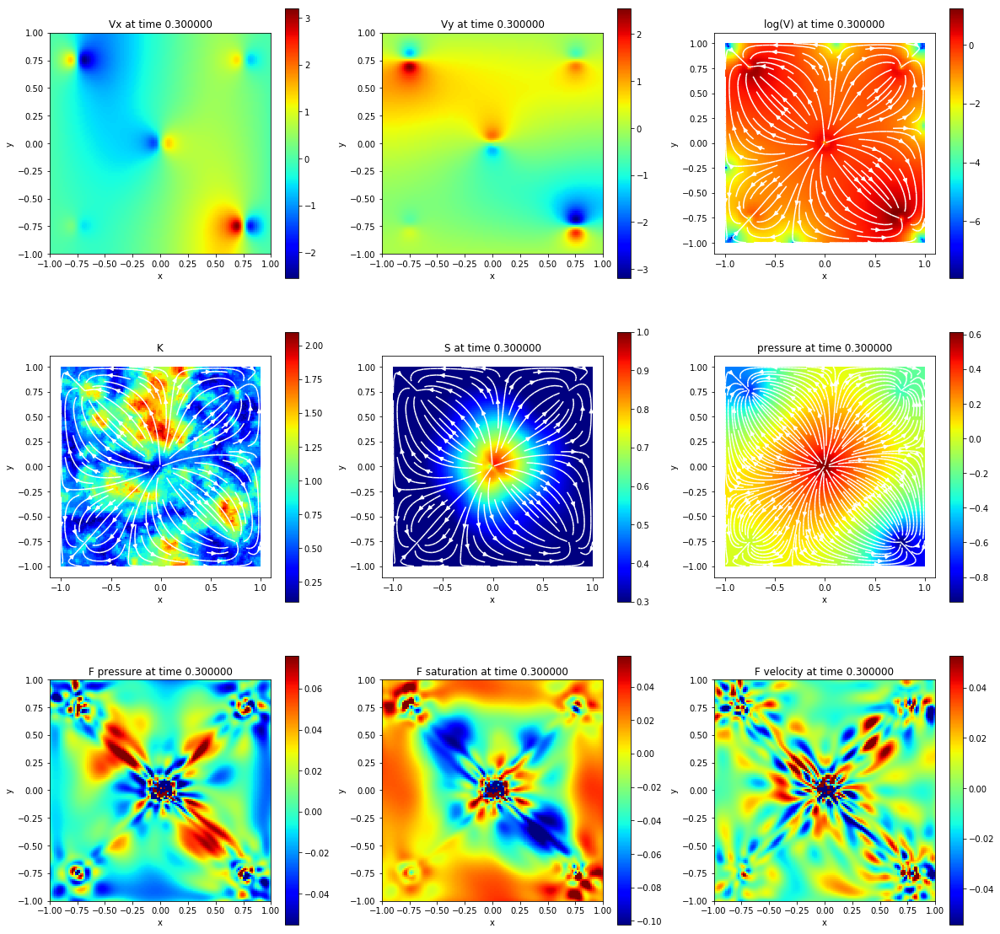

In [24]:
draw_prediction(0.3)

Took 0.020038 second to compute 16641 data points at time 0.800000


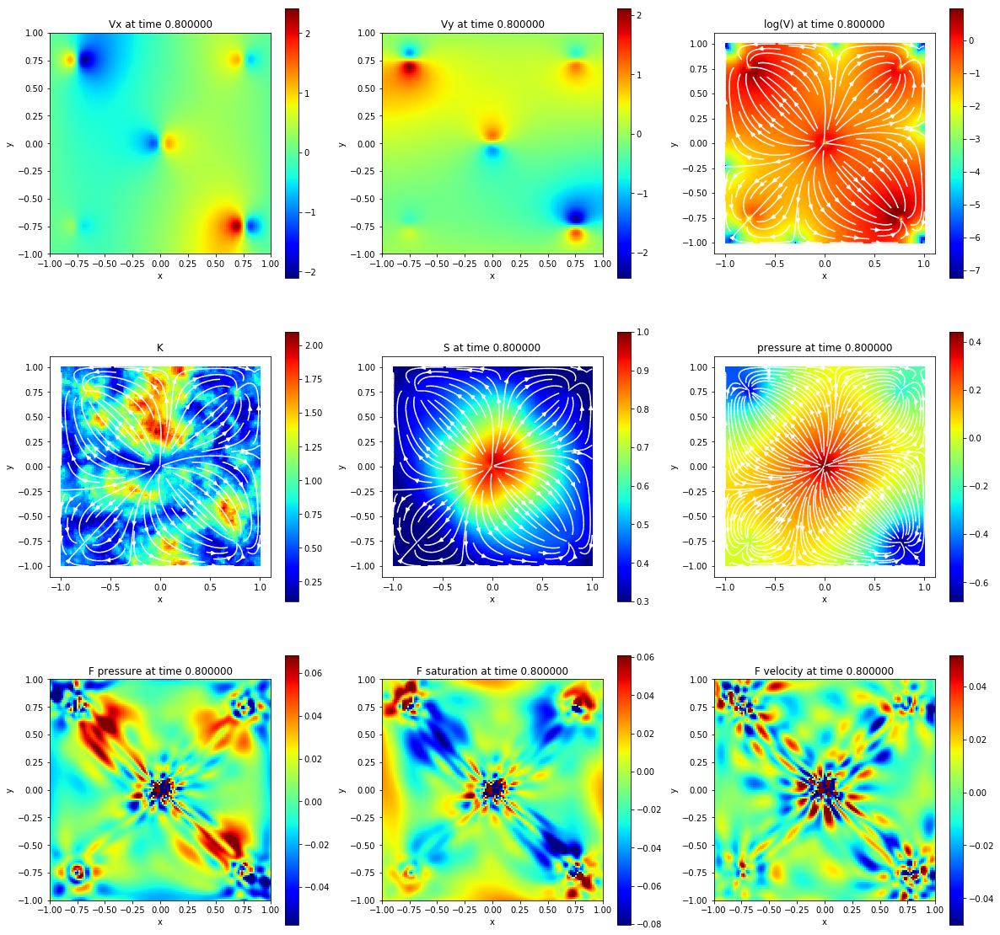

In [23]:
draw_prediction(0.8)

In [25]:
loss = {'Loss':[],'sw':[],'vx':[],'vy':[],'fp':[],'fs':[],'fv':[]}
with open('loss.txt','rb') as f:
    for line in f:
        line = line.decode('utf-8')
        if (len(line)>4) and (line[:4]=='Iter'):
            tmp = [item.split(':') for item in line.split(',')[1:]]
            for item in tmp:
                loss[item[0].lstrip()].append(float(item[1]))

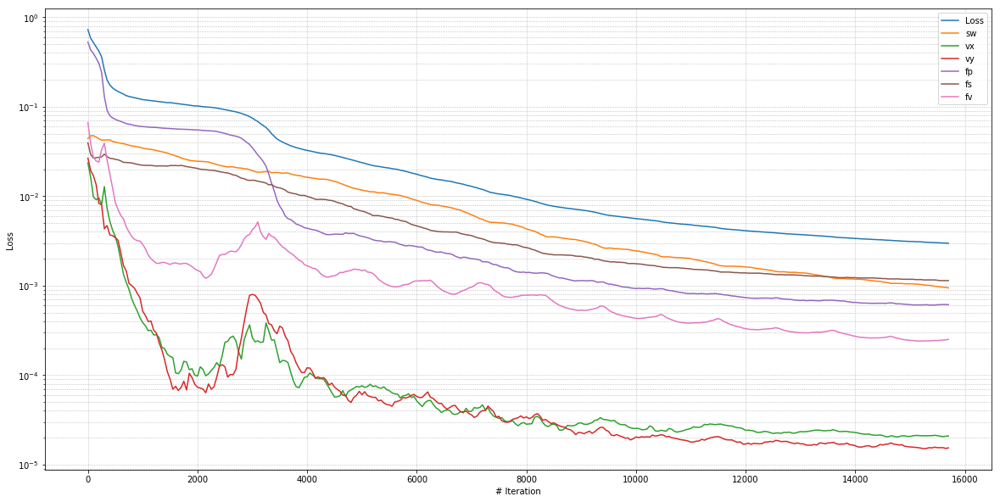

In [26]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)
for key in loss:
    l = len(loss[key])
    plt.plot(range(0,l*50,50),loss[key],label=key)

plt.xlabel('# Iteration')
plt.ylabel('Loss')
ax.set_yscale('log')
plt.legend()
ax.grid(linestyle=":",which='both')

### Loss by category
-  Saturation contributes to most lost, both through initial condition and through equation.
-  Probably because saturation also has time evolution, where the time dependency of velocity and pressrue are basically due to saturation.
-  Boundary condition are well honored.
-  Tried to add weight to saturation loss in the total loss function. Didn't observe significant difference.
-  Smooth loss curve. Not too much randomness as i didn't use mini-batch.

### Furthre thought?
-  Have to implement heterogeneity to see if it makes a difference
-  Mini batch night be a good idea. Probabaly train faster because fewer computation happends in each iteration.
-  Hard to imaging 3D for now